# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### In many urban cities, rental bikes have been introduced to improve the convenience of mobility. To ensure the smooth functioning of this service, it's essential that bikes are available and accessible to the public at the right time, reducing waiting times. Ensuring a consistent and reliable supply of rental bikes has become a significant challenge. The key issue is predicting the number of bikes needed each hour to maintain a stable supply for public use.

## <b> Data Description </b>

### The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - Non Functional Day, Functional hours (The company is functionong or not)

In [192]:
# importing important libraries
import pandas as pd
import numpy as np
from save_load_model import *
import matplotlib.pyplot as plt
import seaborn as sns

In [193]:
file_path='data.csv'

In [194]:
# Reading CSV file. 
bike_df=pd.read_csv(file_path,encoding="latin")

ERROR IN THE ENCODING,IF WE REMOVE THE ENCODING: specifies the character encoding used to read the file.

# *Data Exploration And Data Cleaning*

In [195]:
# Check 1st Five rows
bike_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [196]:
# Check last 5 rows
bike_df.tail(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [197]:
# Check Total rows and Columns in dataset.
# Rows= 8760
# Columns=14
print(f'The shape of dataset is {(bike_df.shape)}')
print(f'Total Rows are : {(bike_df.shape)[0]}')
print(f'Total Columns are : {(bike_df.shape)[1]}')

The shape of dataset is (8760, 14)
Total Rows are : 8760
Total Columns are : 14


In [198]:
# Check the info of dataset to know the data types of columns or variable
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

***Observations*** 

1)Null values/missing values- 0.

2)Date- columns need to convert into proper data type.

3)Columns to convert into numeric(for modelling Purpose)
  * seasons
  * holiday
  * functioning day


4) Rename columns-
   * Temperature(°C)
   * Humidity(%)
   * Wind speed (m/s)
   * Visibility (10m)
   * Dew point temperature(°C)
   * Solar Radiation (MJ/m2)
   * Rainfall(mm)
   * Snowfall (cm)
   * Rented Bike Count,Functioning Day.
   
  Beacuse white spaces and variables having units in brackets  which makes difficult to copy variable name.

In [199]:
# Check columns
bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [200]:
#Since the variables having units with name, renaming columns for better variable analysis.
bike_df.rename(columns={'Rented Bike Count':'Rented_Bike_Count','Temperature(°C)':'Temperature','Humidity(%)':'Humidity','Wind speed (m/s)':'Wind_speed',
                       'Visibility (10m)':'Visibility','Dew point temperature(°C)':'Dew_point_temperature', 'Solar Radiation (MJ/m2)':'Solar_Radiation',
                        'Rainfall(mm)':'Rainfall','Snowfall (cm)':'Snowfall','Functioning Day':'Functioning_Day'},inplace=True)

In [201]:
# Change The datatype of Date columns to extract Month ,Day , year for furthur analysis
bike_df['Date'] = pd.to_datetime(bike_df['Date'], dayfirst=True)
# converts the data colums into date time format with ns precision


In [202]:
# Creating new columns Month, Year ,Day
bike_df['Month']=bike_df['Date'].dt.month

bike_df['Day']=bike_df['Date'].dt.day_name()  

#dt.day_name() will give day names 
# dt.month will give month numbers as 1,2,3,...12 

In [203]:
def week_daay_end(s):
	if s=='Saturday' or s=='Sunday':
		return 1
	else:
		return 0
#   Creating new column and Encoding with 1 if its weekend and 0 if its Weekdays.
bike_df['Weekdays_or_weekend']=bike_df['Day'].apply(week_daay_end)

In [204]:
# Adding lag features to capture autocorrelation
bike_df['lag_1'] = bike_df['Rented_Bike_Count'].shift(1)
bike_df['lag_2'] = bike_df['Rented_Bike_Count'].shift(2)

In [205]:
print(bike_df['lag_1'])
print(bike_df['lag_2'])

0          NaN
1        254.0
2        204.0
3        173.0
4        107.0
         ...  
8755    1384.0
8756    1003.0
8757     764.0
8758     694.0
8759     712.0
Name: lag_1, Length: 8760, dtype: float64
0          NaN
1          NaN
2        254.0
3        204.0
4        173.0
         ...  
8755    1047.0
8756    1384.0
8757    1003.0
8758     764.0
8759     694.0
Name: lag_2, Length: 8760, dtype: float64


In [206]:
# Adding rolling features to capture trends
bike_df['rolling_mean_3'] = bike_df['Rented_Bike_Count'].rolling(window=3).mean()

In [207]:
# Ensure no data leakage by dropping rows with NaN values (from lagging/rolling)
bike_df.dropna(inplace=True)

In [208]:
print(bike_df['rolling_mean_3'])

2        210.333333
3        161.333333
4        119.333333
5         95.000000
6        119.666667
           ...     
8755    1144.666667
8756    1050.333333
8757     820.333333
8758     723.333333
8759     663.333333
Name: rolling_mean_3, Length: 8758, dtype: float64


In [209]:
print(bike_df['Weekdays_or_weekend'])

2       0
3       0
4       0
5       0
6       0
       ..
8755    0
8756    0
8757    0
8758    0
8759    0
Name: Weekdays_or_weekend, Length: 8758, dtype: int64


In [210]:
# check the Newly Created columns
bike_df.head(2)

,Date,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Weekdays_or_weekend,lag_1,lag_2,rolling_mean_3
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday,0,204.0,254.0,210.333333
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,Friday,0,173.0,204.0,161.333333


In [211]:
# Now We can Drop 
# Date column:  as the output is not dependent on Date 
# Day column: as we have extracted as weekday or weekend above

bike_df.drop(['Date',"Day"],axis=1 ,inplace=True)

In [212]:
#Get distinct categories counts for Seasons categories
bike_df['Seasons'].value_counts()

Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2158
Name: count, dtype: int64

In [213]:
#Get distinct categories counts for Holiday categories
bike_df['Holiday'].value_counts()

Holiday
No Holiday    8326
Holiday        432
Name: count, dtype: int64

In [214]:
#Get distinct categories counts for Functioning_Day categories
bike_df['Functioning_Day'].value_counts()

Functioning_Day
Yes    8463
No      295
Name: count, dtype: int64

In [215]:
#Get distinct categories counts for for Month categories
bike_df['Month'].value_counts()

Month
1     744
3     744
5     744
7     744
8     744
10    744
12    742
4     720
6     720
9     720
11    720
2     672
Name: count, dtype: int64

In [216]:
#Get distinct categories counts for for Weekdays_or_weekend categories
bike_df['Weekdays_or_weekend'].value_counts()

Weekdays_or_weekend
0    6262
1    2496
Name: count, dtype: int64

In [217]:
## Check the Summary of Bike data to egt mean,max,25%,50%,75% etc
bike_df.describe()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Month,Weekdays_or_weekend,lag_1,lag_2,rolling_mean_3
count,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000,8758.000000
mean,704.710665,11.502512,12.887086,58.230989,1.724960,1436.697191,4.078762,0.569241,0.148721,0.075086,6.524777,0.284997,704.667276,704.614981,704.664307
std,645.030955,6.921372,11.943010,20.362328,1.036359,608.308622,13.057752,0.868803,1.128320,0.436795,3.447449,0.451439,645.051856,645.069826,613.562029
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,191.000000,6.000000,3.500000,42.000000,0.900000,940.000000,-4.675000,0.000000,0.000000,0.000000,4.000000,0.000000,191.000000,191.000000,211.000000
50%,505.000000,12.000000,13.700000,57.000000,1.500000,1697.500000,5.100000,0.010000,0.000000,0.000000,7.000000,0.000000,504.500000,504.000000,511.666667
75%,1065.750000,17.750000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,10.000000,1.000000,1065.750000,1065.750000,1082.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,12.000000,1.000000,3556.000000,3556.000000,2963.333333


In [218]:
# check for Null values in our bike data
# as we can see we don't have any null values.
bike_df.isnull().sum()

Rented_Bike_Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
Month                    0
Weekdays_or_weekend      0
lag_1                    0
lag_2                    0
rolling_mean_3           0
dtype: int64

Text(0.5, 1.0, ' Visualising Missing Values')

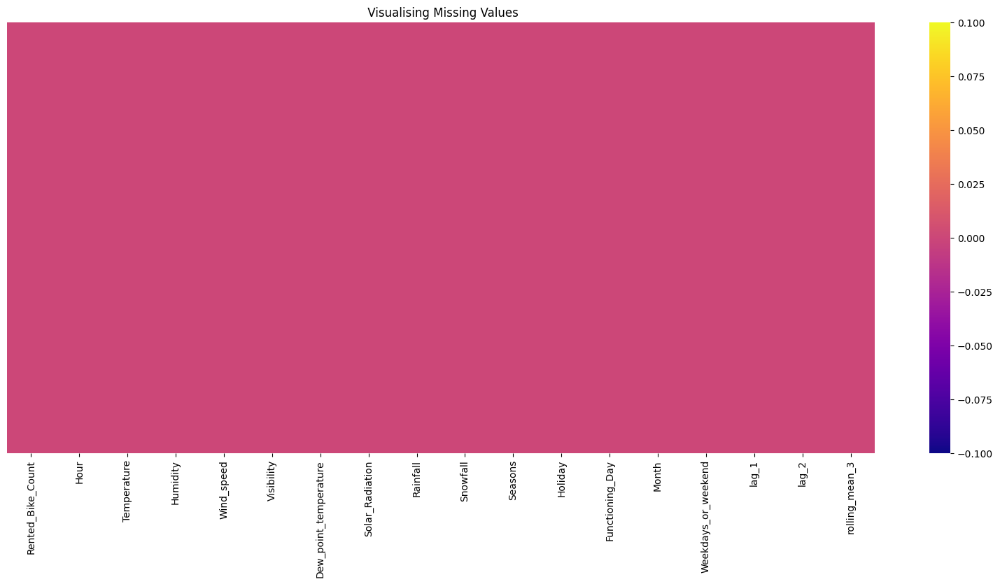

In [219]:
# Visulaizing null values using heatmap.
plt.figure(figsize=(20,8))
sns.heatmap(bike_df.isnull(),cmap='plasma',annot=False,yticklabels=False)
plt.title(" Visualising Missing Values")

No Null values found.

In [220]:
# checking Duplicate rows in our BikeData.
duplicates=bike_df.duplicated().sum()
print(f"We have {duplicates} rows in our Bike Data.")
# No duplicate rows found

We have 0 rows in our Bike Data.


# EDA

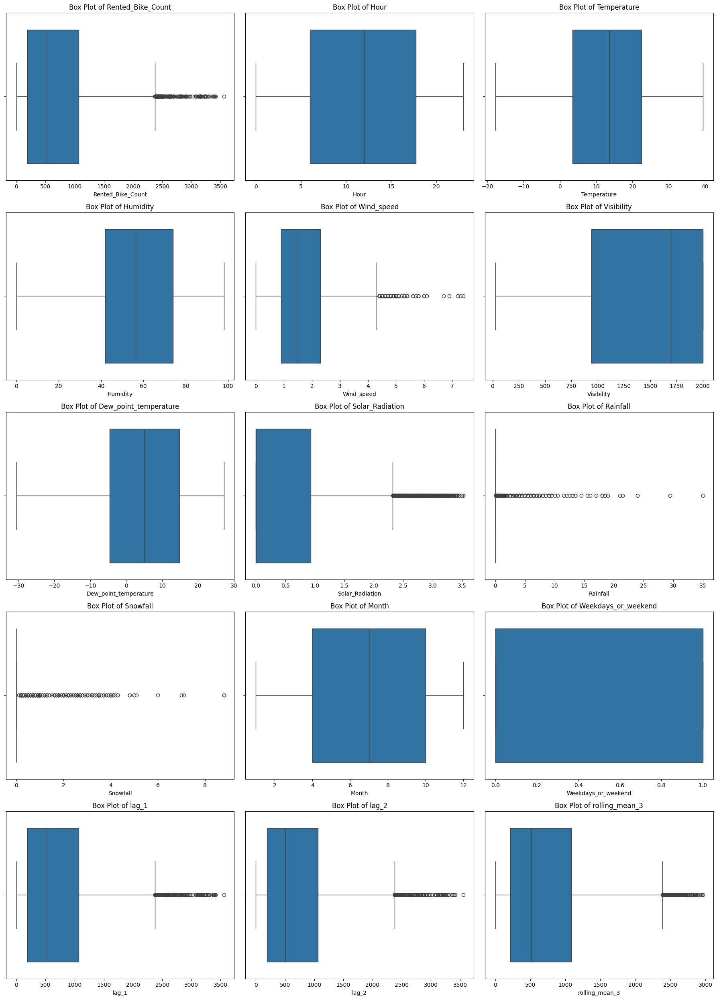

In [221]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create numeric columns list, including new time-series features
numeric_col = bike_df.select_dtypes(include='number').columns.tolist()

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plotting boxplots for each numeric column
for i, col in enumerate(numeric_col):
    sns.boxplot(x=bike_df[col], ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}')

# Hide any unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout
plt.tight_layout()
plt.show()


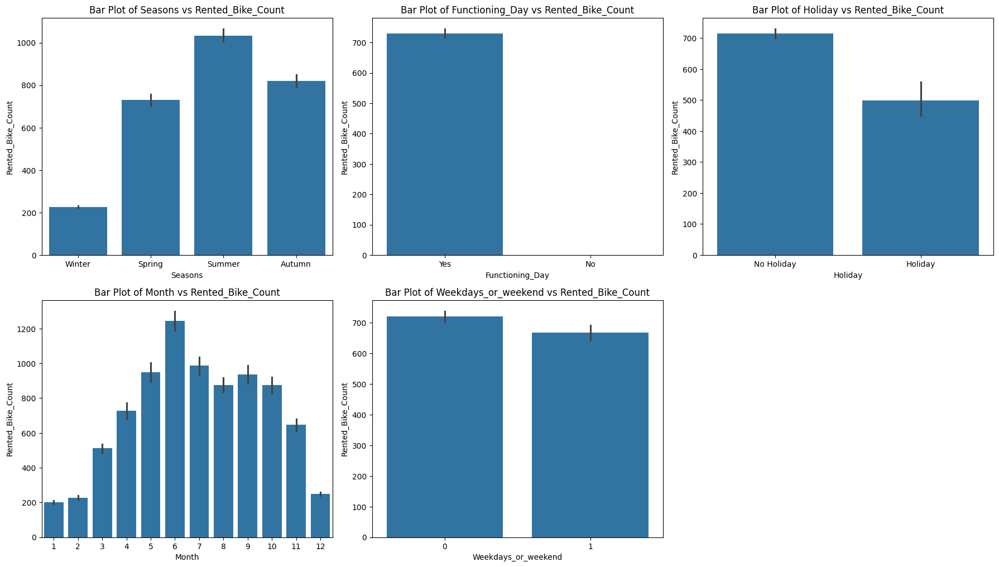

In [222]:
# create categorical column list
categorical_columns= list(set(bike_df.columns) - set(bike_df.describe().columns))

# Adding two more categorical columns
categorical_columns.extend(['Month', 'Weekdays_or_weekend'])

# Number of categorical columns
num_cats = len(categorical_columns)


# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plotting bar charts for each categorical column
for i, col in enumerate(categorical_columns):
    sns.barplot(x=bike_df[col], y=bike_df['Rented_Bike_Count'], ax=axes[i])
    axes[i].set_title(f'Bar Plot of {col} vs Rented_Bike_Count')

# Remove empty subplots, if any
for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

# Adjust the layout
plt.tight_layout()
plt.show()


**Observations From Above Barcharts:**

1) Summer season had the higest Bike Rent Count. People are more likely to rent bikes in summer. Bike rentals in winter is very less compared to other seasons.

2) High number of bikes were rented on No Holidays.

3) On no functioning day no bikes were rented. we have only 295 counts of "NO". Thus we can drop that 295 values but column having only 'Yes' will not add value to our column.So these columns is not use full for us. We can drop those.

4) Most of the bikes were rented on Weekdays compared to weekends.

5) From March Bike Rent Count started increasing and it was highest in June. 

### **Let's check Bike Rent Count trend with respect  to Hour on Functioning days,weekends or weekdays,seasons,Holidays columns.**

Text(0.5, 1.0, 'Bike Rental Trend according to Hour on Holiday / No Holiday')

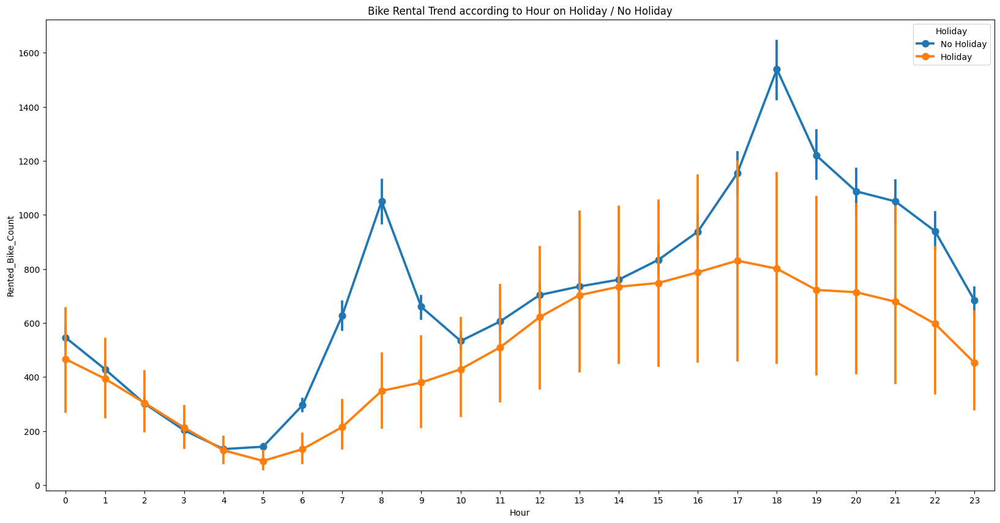

In [223]:
# Bike Rental trend with respect to Hour on Holiday or No Holiday.
plt.figure(figsize=(20,10))
sns.pointplot(x=bike_df['Hour'],y=bike_df['Rented_Bike_Count'],hue=bike_df['Holiday'])
plt.title("Bike Rental Trend according to Hour on Holiday / No Holiday")

## ***Observation***
 #### 1)There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak ( NO Holiday).
 #### 2) Again there is peak between 3/4 PM to 7 PM. may be its office leaving time for the above people ( NO Holiday).

  But on Holiday the case is different  less bike rentals happend.


Text(0.5, 1.0, 'Bike Rental Trend according to Hour on Functioning day')

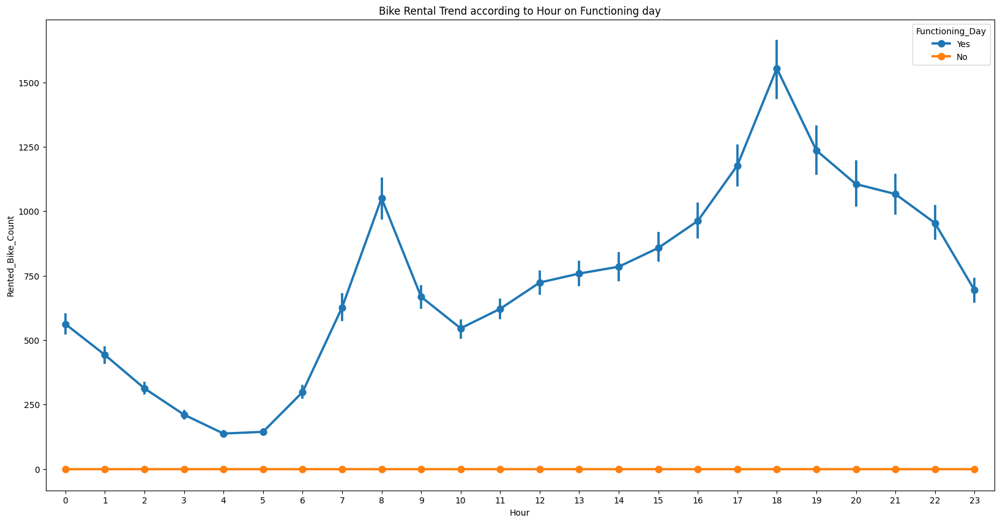

In [224]:
## Bike Rental trend with respect to Hour on Functioning day.
plt.figure(figsize=(20,10))
sns.pointplot(x=bike_df['Hour'],y=bike_df['Rented_Bike_Count'],hue=bike_df['Functioning_Day'])
plt.title("Bike Rental Trend according to Hour on Functioning day")

## ***Observation***
1) Here the trend for functioning day is same as of No holiday. Only the difference is on No functioning day there is no bike rentals.
(if we drop no fucntioning day rows. we will left only with the functioning day values.thus the column having same value through out will not be helpful.)

    ***So,its better to drop the column.***

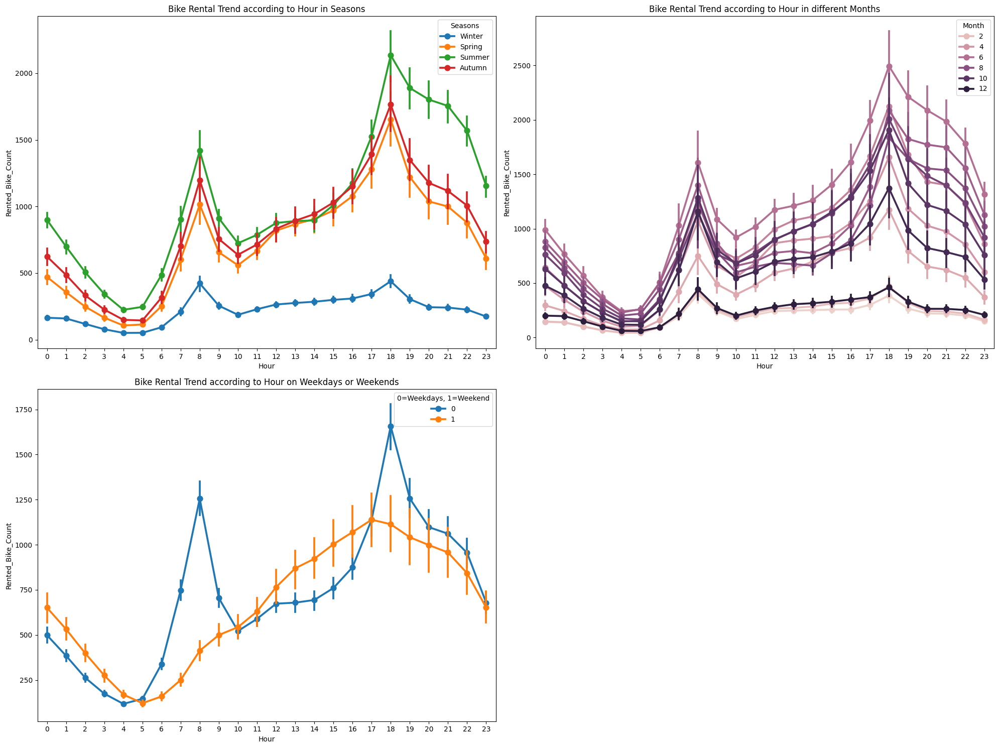

In [225]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the subplots: 2 rows and 2 columns, with one empty subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))

# Flatten the axes for easier plotting
axes = axes.flatten()

# First plot: Bike Rent Count trend with respect to Hours on Seasons
sns.pointplot(x=bike_df['Hour'], y=bike_df['Rented_Bike_Count'], hue=bike_df['Seasons'], ax=axes[0])
axes[0].set_title("Bike Rental Trend according to Hour in Seasons")

# Second plot: Bike Rent Count trend with respect to Hours on Months
sns.pointplot(x=bike_df['Hour'], y=bike_df['Rented_Bike_Count'], hue=bike_df['Month'], ax=axes[1])
axes[1].set_title("Bike Rental Trend according to Hour in different Months")

# Third plot: Bike Rent Count trend with respect to Hours on Weekdays or Weekends
sns.pointplot(x=bike_df['Hour'], y=bike_df['Rented_Bike_Count'], hue=bike_df['Weekdays_or_weekend'], ax=axes[2])
axes[2].set_title("Bike Rental Trend according to Hour on Weekdays or Weekends")
axes[2].legend(title="0=Weekdays, 1=Weekend")

# Remove the fourth empty subplot
fig.delaxes(axes[3])

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


***The Observation Of these stick plots will be same as bar plots just maxima minima is used for more in depth inference of the data***

### **Let's check distribution of target variable- "Bike Rented Count"**

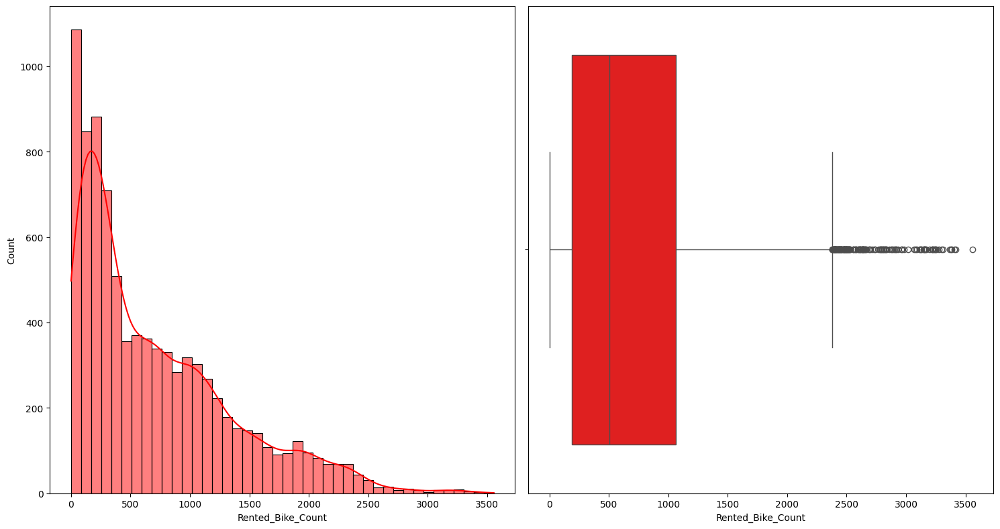

In [226]:
# Create subplots
f, axes = plt.subplots(1, 2, figsize=(15, 8))
# Plot the histogram
sns.histplot(bike_df['Rented_Bike_Count'], kde=True, color='red', ax=axes[0])

# Plot the boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='red', ax=axes[1])

# Display the plots
plt.tight_layout()
plt.show()


**Our target varibale's distribution is slightly right skewed.**

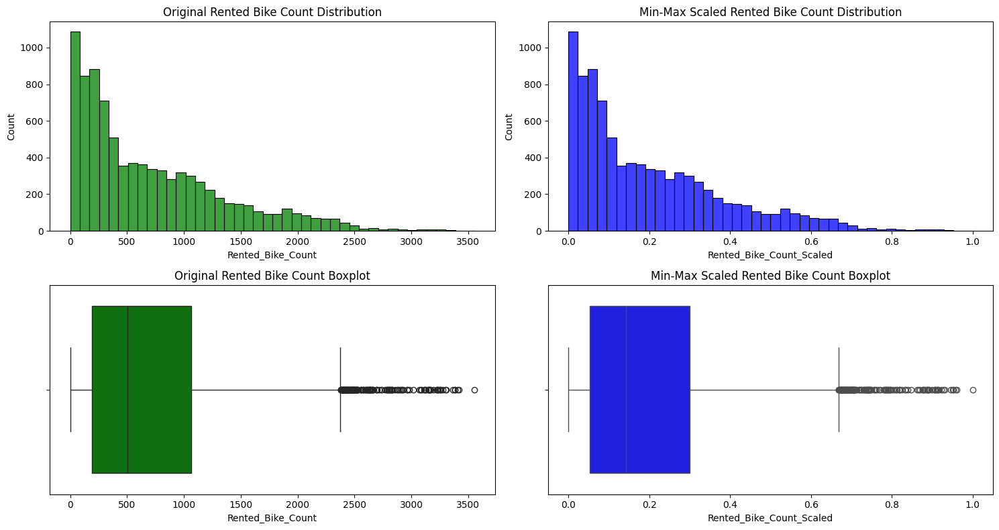

In [227]:
from sklearn.preprocessing import MinMaxScaler

# Assuming bike_df is your DataFrame and 'Rented_Bike_Count' is the target variable
scaler = MinMaxScaler()

# Reshape the data since MinMaxScaler expects a 2D array
rented_bike_count_scaled = scaler.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_scaled, columns=['Rented_Bike_Count_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Min-Max Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Min-Max Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


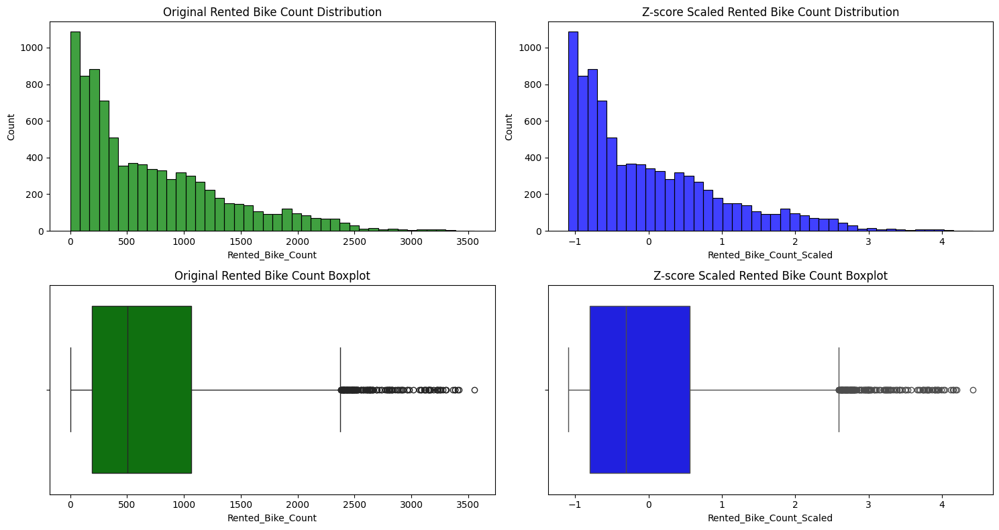

In [228]:
from sklearn.preprocessing import StandardScaler

# Assuming bike_df is your DataFrame and 'Rented_Bike_Count' is the target variable
scaler = StandardScaler()

# Reshape the data since StandardScaler expects a 2D array
rented_bike_count_scaled = scaler.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_scaled, columns=['Rented_Bike_Count_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Z-score Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Z-score Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


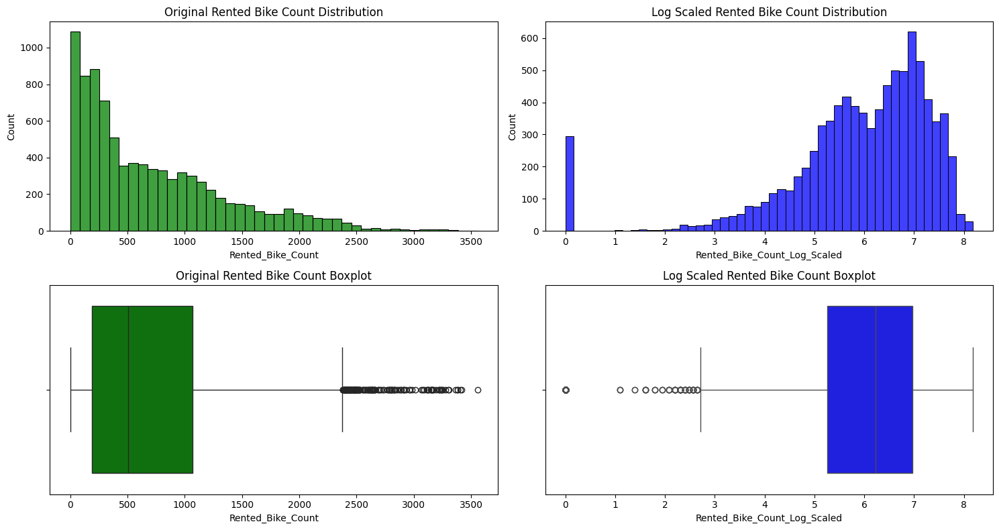

In [229]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import FunctionTransformer
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming bike_df is your DataFrame and 'Rented_Bike_Count' is the target variable

# Create a log transformer using FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)  # np.log1p is used for log(1+x)

# Reshape the data since FunctionTransformer expects a 2D array
rented_bike_count_log_scaled = log_transformer.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_log_scaled, columns=['Rented_Bike_Count_Log_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], color='g', ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the log-scaled data histogram
sns.histplot(scaled_df['Rented_Bike_Count_Log_Scaled'], color='b', ax=axes[0, 1])
axes[0, 1].set_title('Log Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], color='g', ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the log-scaled data boxplot
sns.boxplot(x=scaled_df['Rented_Bike_Count_Log_Scaled'], color='b', ax=axes[1, 1])
axes[1, 1].set_title('Log Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


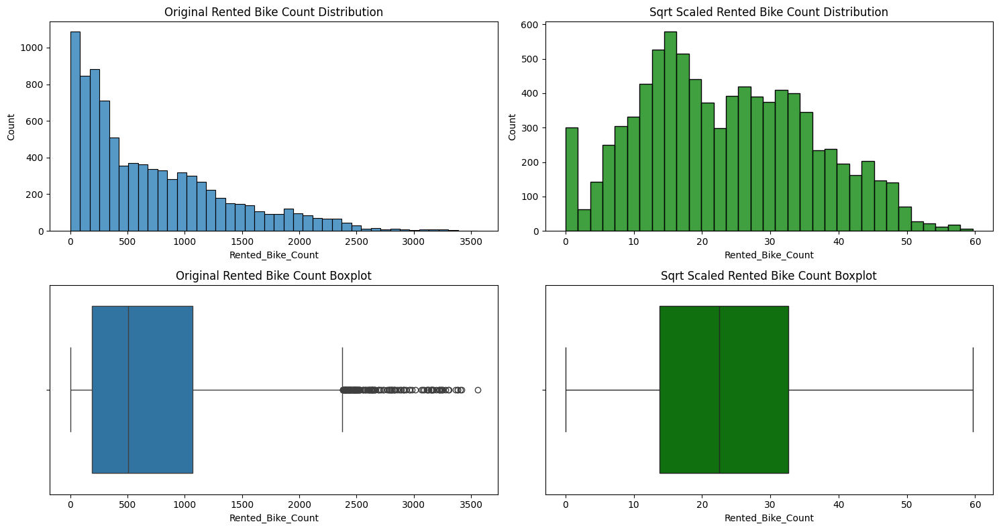

In [230]:
# Create a log transformer using FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)  # np.log1p is used for log(1+x)

# Reshape the data since FunctionTransformer expects a 2D array
rented_bike_count_log_scaled = log_transformer.fit_transform(bike_df[['Rented_Bike_Count']])

# Convert back to DataFrame for easy plotting
scaled_df = pd.DataFrame(rented_bike_count_log_scaled, columns=['Rented_Bike_Count_Log_Scaled'])

# Create subplots for visualization
f, axes = plt.subplots(2, 2, figsize=(15, 8))

# Plot the original data histogram
sns.histplot(bike_df['Rented_Bike_Count'], ax=axes[0, 0])
axes[0, 0].set_title('Original Rented Bike Count Distribution')

# Plot the sqrt-scaled data histogram
sns.histplot(x=np.sqrt(bike_df['Rented_Bike_Count']), color='g', ax=axes[0, 1])
axes[0, 1].set_title('Sqrt Scaled Rented Bike Count Distribution')

# Plot the original data boxplot
sns.boxplot(x=bike_df['Rented_Bike_Count'], ax=axes[1, 0])
axes[1, 0].set_title('Original Rented Bike Count Boxplot')

# Plot the sqrt-scaled data boxplot
sns.boxplot(x=np.sqrt(bike_df['Rented_Bike_Count']), color='g', ax=axes[1, 1])  # Fixed axis reference
axes[1, 1].set_title('Sqrt Scaled Rented Bike Count Boxplot')

# Show the plots
plt.tight_layout()
plt.show()


Thus we normalized our dependent variable and found the best scalar is square root method and also in boxplot we can see there are no outliers present.

## **Let's check distribution of independent variables**

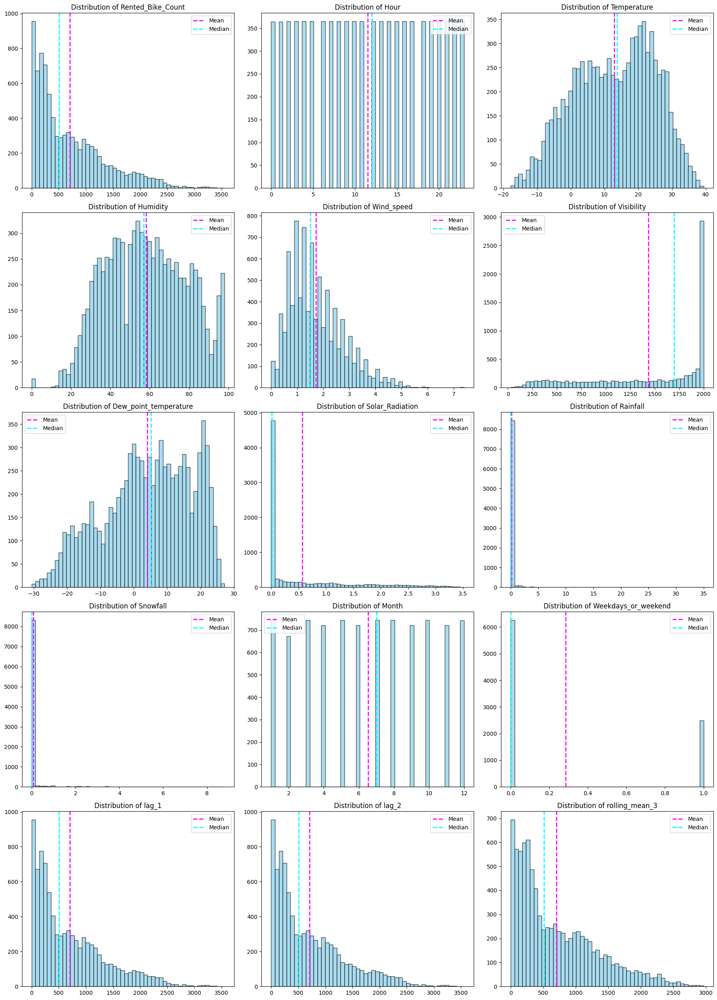

In [231]:
import matplotlib.pyplot as plt

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting histograms for each numeric column
for i, col in enumerate(numeric_col):
    feature = bike_df[col]
    axes[i].hist(feature, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
    axes[i].axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2, label='Mean')
    axes[i].axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2, label='Median')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].legend()

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


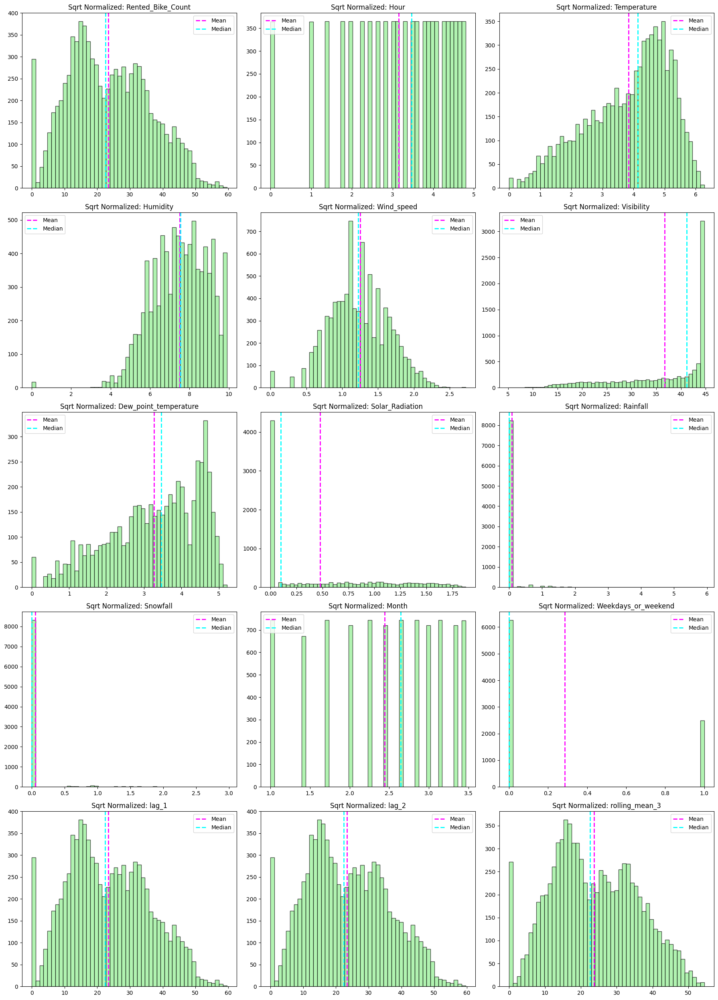

In [232]:
import numpy as np
import matplotlib.pyplot as plt

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting histograms for the square root normalized variables
for i, col in enumerate(numeric_col):
    feature = np.sqrt(bike_df[col])  # Apply square root normalization
    axes[i].hist(feature, bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
    axes[i].axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2, label='Mean')
    axes[i].axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2, label='Median')
    axes[i].set_title(f'Sqrt Normalized: {col}')
    axes[i].legend()

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()



## **Check the relationship between all variables with each other variable**

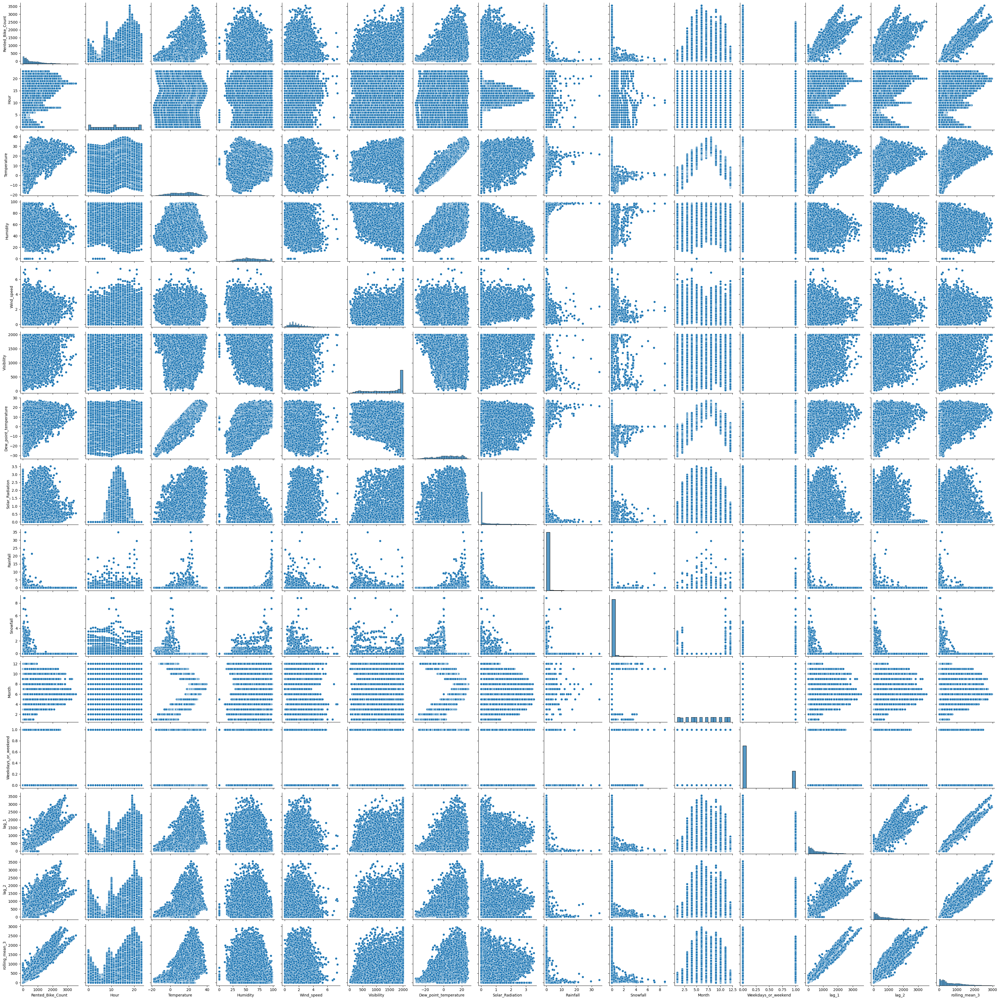

In [233]:
sns.pairplot(bike_df)

## **Lets check the relationship between the dependent variable-"Rented Bike Count'and remaining columns(independent variable) In depth.**

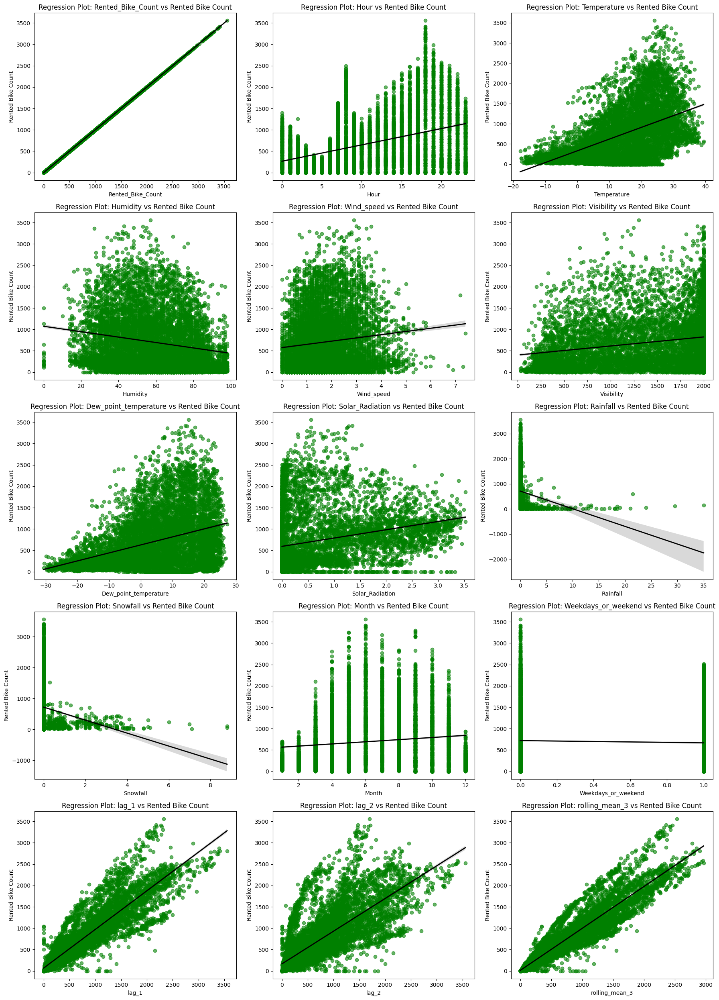

In [234]:
import matplotlib.pyplot as plt
import seaborn as sns

# Number of numeric columns
num_cols = len(numeric_col)

# Define the number of rows and columns for subplots (3 columns per row)
ncols = 3
nrows = -(-num_cols // ncols)  # Ceiling division to calculate rows dynamically

# Create the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5 * nrows))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Plotting regression plots for each numeric column
for i, col in enumerate(numeric_col):
    sns.regplot(
        x=bike_df[col],
        y=bike_df['Rented_Bike_Count'],
        scatter_kws={'color': 'green', 'alpha': 0.6},  # Improved scatter visibility
        line_kws={'color': 'black', 'linewidth': 2},   # Thicker regression line
        ax=axes[i]
    )
    axes[i].set_title(f'Regression Plot: {col} vs Rented Bike Count')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Rented Bike Count')

# Hide unused subplots if total columns don't fill all plots
for j in range(len(numeric_col), len(axes)):
    axes[j].axis('off')

# Adjust the layout for a cleaner look
plt.tight_layout()
plt.show()


## **Hour:**
 #### 1)There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak.
 #### 2) Again there is peak between 5 PM to 7 PM. may be its office leaving time for the above people.
  #### 3) We can say that,from morning 7 AM to Evening 7 PM we have good Bike Rent Count. and from 7 PM to 7 AM Bike Rent count starts declining.

## **Temperature:**
#### 1) For decrease in temperature below 0 deg celicus the bike rent count is significantly decreased because may be people dont want to ride bike in such cold temperature.
#### 2) But for normal temperature the Bike rent count is very high.

## **humidity**
#### 1) Here its seems like humidty is inversely proportional to bike rent count. As humdity percentage is increasing there is decrease in bike rent count.

## **Wind Speed:**
#### 1) upto wind speed 4 m/s there is good bike rent count.

## **Visibility**
#### 1) It's very obivious that as visibilty increases the bike rent count also increases. Nobody would prefere to ride in low visibilty.

## **Dew Point Temperature**
#### 1)It's again the same case as of temperature. As dew temperature goes below 0 deg celcius there is less bike rent count. It looks like Dew Point temperature and Temperature columns have strong colinarity.

## **Solar radiation**
#### 1)Here the amount of rented bikes is huge, when there is solar radiation.

## **Rainfall And snowfall**
#### 1) Its very obivious that people usually do not like ride bikes in rain and snowfall.


## **Checking Corelation between dependent and independent variable.**

In [235]:
# Plotting the correlation matrix for the int variables
numeric_data = bike_df.select_dtypes(include=['number'])



<Axes: >

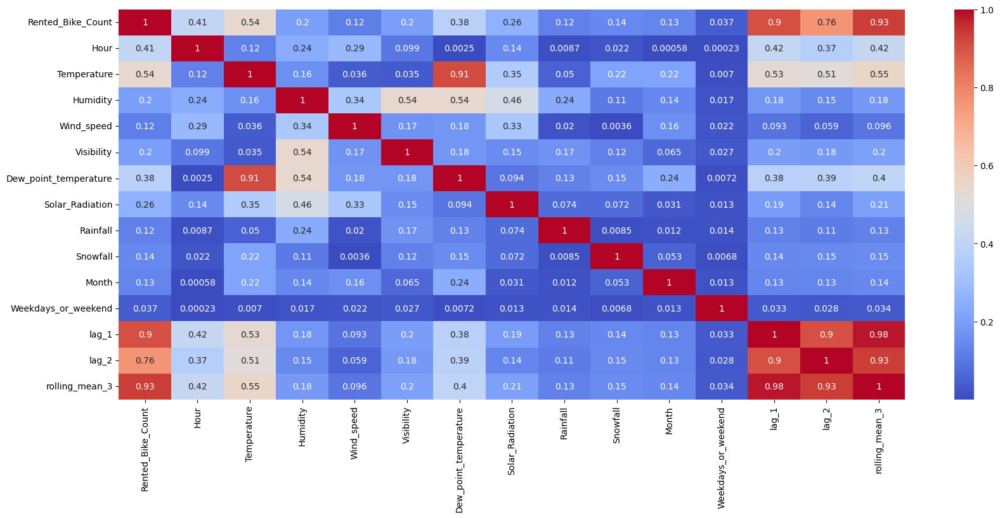

In [236]:
plt.figure(figsize=(20,8))
corr=numeric_data.corr()
sns.heatmap(data=abs(corr),annot=True,cmap='coolwarm')

### Temperature and Dew point Temperature are highly correlated.

### As per our regression assumption, there should not be colinearity between independent variables.
### We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.
### And also we dropped "Date" column as its not useful for us(as we have created the month, weekdays and weekend columns.

In [237]:
# make copy of dataset

df=bike_df.copy()

# **Modeling**

## ***Feature Extraction***

In [238]:
df.head(1)

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Weekdays_or_weekend,lag_1,lag_2,rolling_mean_3
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,0,204.0,254.0,210.333333


In [239]:
# Since Temperature and Dew point temperature are corelated with each other. We will drop dew point temperature.
df.drop('Dew_point_temperature',inplace=True,axis=1)

In [240]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def Calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [241]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count']]])

,variables,VIF
0,Hour,4.838901
1,Temperature,4.795588
2,Humidity,6.444147
3,Wind_speed,4.662287
4,Visibility,5.519951
5,Solar_Radiation,2.353756
6,Rainfall,1.109178
7,Snowfall,1.131264
8,Month,5.041369
9,Weekdays_or_weekend,1.383620


humidity vif is greater than 5 so we will remove that column. 

In [242]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Humidity']]])

,variables,VIF
0,Hour,4.702822
1,Temperature,3.912717
2,Wind_speed,4.284146
3,Visibility,5.396676
4,Solar_Radiation,1.973907
5,Rainfall,1.088791
6,Snowfall,1.096336
7,Month,4.088162
8,Weekdays_or_weekend,1.361122
9,lag_1,73.859089


humidity vif is greater than 5 so we will remove that column.

In [243]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ['Rented_Bike_Count','Humidity','Visibility']]])

,variables,VIF
0,Hour,4.607208
1,Temperature,3.911174
2,Wind_speed,3.661458
3,Solar_Radiation,1.969277
4,Rainfall,1.078782
5,Snowfall,1.091288
6,Month,3.319006
7,Weekdays_or_weekend,1.351081
8,lag_1,73.785129
9,lag_2,19.316598


Now we have VIF values in the range of 1 to 5. we will drop 'Humidity','Visibility' this columns from our dataset

In [244]:
# As per above vif calculation dropping humidity and visibility columns.
df.drop(['Humidity','Visibility','lag_1','lag_2'],inplace=True,axis=1)

In [245]:
# checking categoiries in season column.
df['Seasons'].value_counts()

Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2158
Name: count, dtype: int64

In [246]:
# Createing dummy variables
df=pd.get_dummies(df,columns=['Seasons'],prefix='Seasons',drop_first=True)


In [247]:
# checking categoiries in holiday columns.
df['Holiday'].value_counts()

Holiday
No Holiday    8326
Holiday        432
Name: count, dtype: int64

In [248]:
# Labeling for holiday=1 and no holiday=0
df['Holiday']=df['Holiday'].map({'No Holiday':0, 'Holiday':1})

In [249]:
# # Labeling for Yes=1 and no No=0
df['Functioning_Day']=df['Functioning_Day'].map({'Yes':1, 'No':0})

In [250]:
# checking dummy and labled columns
df.head(3)


,Rented_Bike_Count,Hour,Temperature,Wind_speed,Solar_Radiation,Rainfall,Snowfall,Holiday,Functioning_Day,Month,Weekdays_or_weekend,rolling_mean_3,Seasons_Spring,Seasons_Summer,Seasons_Winter
2,173,2,-6.0,1.0,0.0,0.0,0.0,0,1,12,0,210.333333,False,False,True
3,107,3,-6.2,0.9,0.0,0.0,0.0,0,1,12,0,161.333333,False,False,True
4,78,4,-6.0,2.3,0.0,0.0,0.0,0,1,12,0,119.333333,False,False,True


In [251]:
# final info before going for modeling
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8758 entries, 2 to 8759
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Rented_Bike_Count    8758 non-null   int64  
 1   Hour                 8758 non-null   int64  
 2   Temperature          8758 non-null   float64
 3   Wind_speed           8758 non-null   float64
 4   Solar_Radiation      8758 non-null   float64
 5   Rainfall             8758 non-null   float64
 6   Snowfall             8758 non-null   float64
 7   Holiday              8758 non-null   int64  
 8   Functioning_Day      8758 non-null   int64  
 9   Month                8758 non-null   int32  
 10  Weekdays_or_weekend  8758 non-null   int64  
 11  rolling_mean_3       8758 non-null   float64
 12  Seasons_Spring       8758 non-null   bool   
 13  Seasons_Summer       8758 non-null   bool   
 14  Seasons_Winter       8758 non-null   bool   
dtypes: bool(3), float64(6), int32(1), int64(5)


## ***Modeling***

In [252]:
# lets import train test split for splitting the data
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error

In [ ]:
# Define X-variable(Independent Variables) and Y-Variable(Dependent Variable)
X=df.drop('Rented_Bike_Count',axis=1)
print(X.shape)
#As the best normalising technique is sqrt from the EDA
y=np.sqrt(df['Rented_Bike_Count'])

In [254]:
# Split data into train test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)


In [255]:
# Transforming data 
# Apply scaling to the linear regression models.
min_max_scaler = MinMaxScaler()
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.transform(X_test)

In [256]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6130, 14)
(6130,)
(2628, 14)
(2628,)


# **Linear Regression**


In [257]:
# Taking instance
l_reg=LinearRegression()
# fitting the model and trainig
l_reg.fit(X_train,y_train)

LinearRegression()

In [258]:
# Cheeck coefficents
l_reg.coef_

array([  1.78099774,   2.38386462,  -0.11115508,   5.97769729,
       -18.73093295,  -4.94248084,  -1.13426281,  14.71074463,
         1.06998017,  -0.37731659,  46.55598405,  -0.58151101,
        -0.7358902 ,  -1.59771113])

In [259]:
# get dataframe for x columns and coefficient
pd.DataFrame(l_reg.coef_,X.columns, columns=['Coefficient'])

,Coefficient
Hour,1.780998
Temperature,2.383865
Wind_speed,-0.111155
Solar_Radiation,5.977697
Rainfall,-18.730933
Snowfall,-4.942481
Holiday,-1.134263
Functioning_Day,14.710745
Month,1.069980
Weekdays_or_weekend,-0.377317


In [260]:
# Check intercept
l_reg.intercept_

-4.495699695536452

In [261]:
#Checking score
print("R2 Score:")
l_reg.score(X_train,y_train)

R2 Score:


0.8967832294666862

In [262]:
# Y peredictions on train data
y_pred_train=l_reg.predict(X_train)

# y predictions on test data
y_pred=l_reg.predict(X_test)

### Evaluation of Train data set

In [263]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 2.914061405763655.
The Mean Squred Error(MSE) is 16.086633726972085.
The Root Mean Squared Error(RMSE) is 4.010814596434505.
The R2 Score is 0.8967832294666862.


Saving train data set results in dataframe.

In [264]:
#Saving train data set results in dataframe.
train_dict={'Model':"Linear Regression",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [265]:
# create training_result dataframe
traing_results_df=pd.DataFrame(train_dict,index=[1])
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
1,Linear Regression,2.9141,16.0866,4.0108,0.8968


### Evaluation of Test data set

In [266]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 2.966645721631167.
 The Mean Squred Error(MSE) is 17.27099088437474.
The Root Mean Squared Error(RMSE) is 4.1558381686941015.
The R2 Score is 0.8871817694415545.


In [267]:
# saving test result in dictionary.
test_dict={'Model':"Linear Regression",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [268]:
# create test_result dataframe
test_results_df=pd.DataFrame(test_dict,index=[1])
test_results_df

,Model,MAE,MSE,RMSE,R2_score
1,Linear Regression,2.9666,17.271,4.1558,0.8872


On testing data R2 score is 0.6213 which is almost close to training data R2 score.Hence we can say that our model performance is good and overfitting is not observed. We need to improve our model performance.

In [269]:
# define a fucntion to plot predicted y values and actual y values
def plot_Pred_vs_actual(y_pred,y_test):
  ''' Visualize predicted values with actaul values'''
  plt.figure(figsize=(20,8))
  plt.plot(y_pred)
  plt.plot(np.array(y_test))
  plt.legend(["Predicted","Actual"],)
  plt.title("Predicted V/S Actual")
  plt.show()

In [270]:
# define a function to plot scatter plot for y_test and y_actual.
def plot_scatter(y_pred,y_test):
  '''Plot scatter plot for y_test values and 
  y_test values. To check how close we are to regresson line'''
  plt.figure(figsize=(16,5))
  sns.regplot(x=y_test,y=y_pred,scatter_kws={'color':'magenta'},line_kws={'color':'black'})
  plt.xlabel('Actual')
  plt.ylabel("Predicted")
  plt.title("Actual v/s Predicted")


In [271]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed).
 #Mean of residuals should be zero or close to 0 as much as possible. It is done to check whether our line is actually the line of “best fit” 
def Residual_histPlot(y_pred,y_test):  
  '''Checks the distribution of residals)'''        
                                                    
  plt.figure(figsize=(10,5))
  sns.histplot(x=y_test-y_pred)

  plt.title("Residual Distribution")


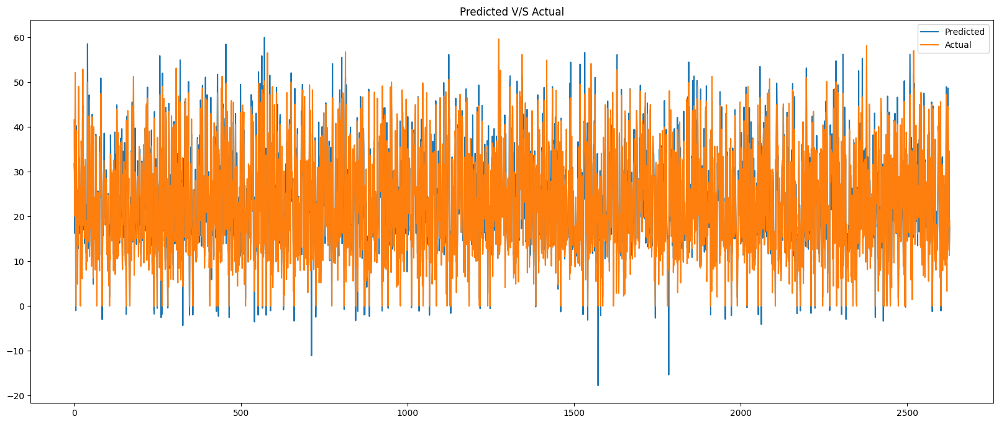

In [272]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

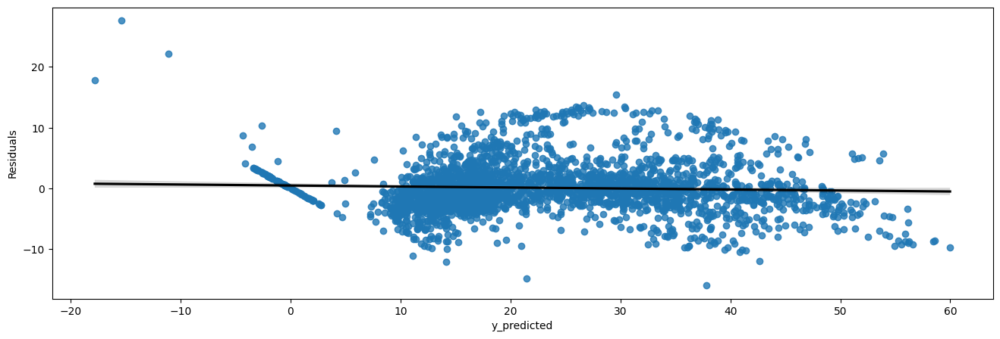

In [273]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

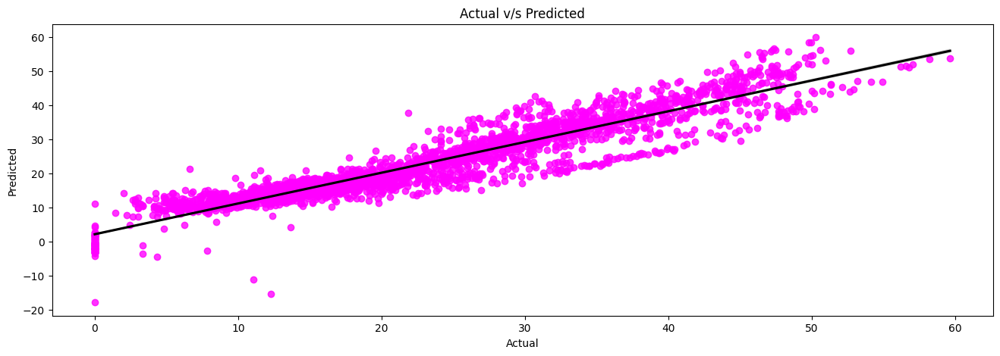

In [274]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

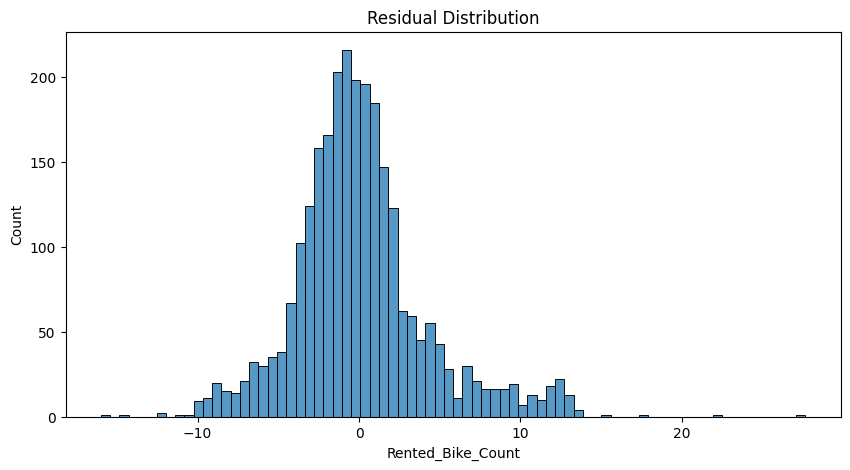

In [275]:
Residual_histPlot(y_pred,y_test)

In [276]:
## saving the model !!
save_model(l_reg,"Linear_Regression_model.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Linear_Regression_model.pkl


### Lasso

In [277]:
# instantiating
lasso_reg=Lasso(alpha=0.01)

In [278]:
# Fitting and training the model
lasso_reg.fit(X_train,y_train)

Lasso(alpha=0.01)

In [279]:
# Check coefficient
lasso_reg.coef_

array([  1.56865826,   1.38323144,  -0.        ,   6.0343518 ,
       -13.55012133,  -0.98811966,  -0.84110319,  14.02962585,
         1.03135657,  -0.29495319,  47.14579253,  -0.36583111,
        -0.31633026,  -1.61865287])

In [280]:
# get dataframe of x columns and Coeficients
pd.DataFrame(lasso_reg.coef_,X.columns,columns=['Coeficients']).reset_index().rename(columns={'index':'X'})

,X,Coeficients
0,Hour,1.568658
1,Temperature,1.383231
2,Wind_speed,-0.000000
3,Solar_Radiation,6.034352
4,Rainfall,-13.550121
5,Snowfall,-0.988120
6,Holiday,-0.841103
7,Functioning_Day,14.029626
8,Month,1.031357
9,Weekdays_or_weekend,-0.294953


In [281]:
# Check score on train dataset
print("R2 Score:")
lasso_reg.score(X_train,y_train)

R2 Score:


0.8960493009911566

In [282]:
# Check score on test dataset
lasso_reg.score(X_test,y_test)

0.8886095556220155

In [283]:
# Check intercept
lasso_reg.intercept_

-3.6116923555897955

In [284]:
# y prdiction on train data
y_pred_train=lasso_reg.predict(X_train)
# y prdiction on test data
y_pred=lasso_reg.predict(X_test)

### Evaluation On Train Data.

In [285]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 2.933957390643899.
The Mean Squred Error(MSE) is 16.20101861332956.
The Root Mean Squared Error(RMSE) is 4.025048895768791.
The R2 Score is 0.8960493009911566.


In [286]:
# Create train results dictionary
train_dict={'Model':"Lasoo",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [287]:

# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960


### Evaluation On Test Data.

In [288]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 2.9658483595905625.
 The Mean Squred Error(MSE) is 17.052415553193633.
The Root Mean Squared Error(RMSE) is 4.129457053075336.
The R2 Score is 0.8886095556220155.


In [289]:

# Create test results dictionary
test_dict={'Model':"Lasso",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [290]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886


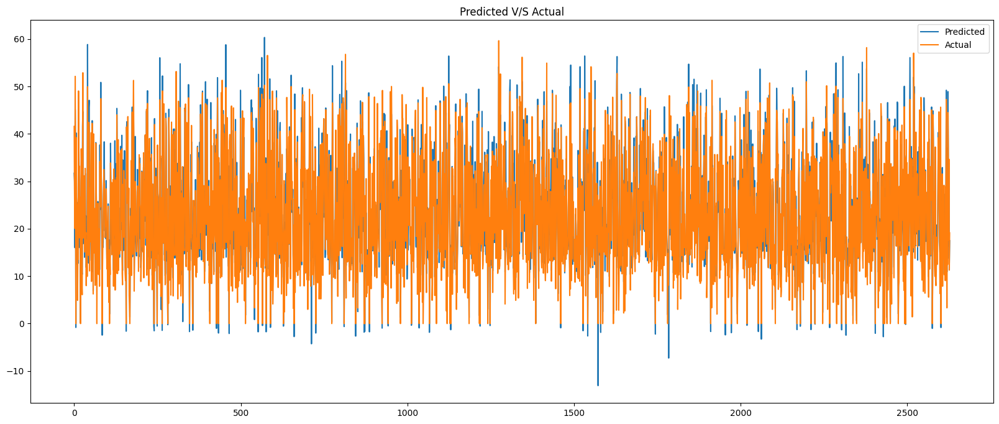

In [291]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

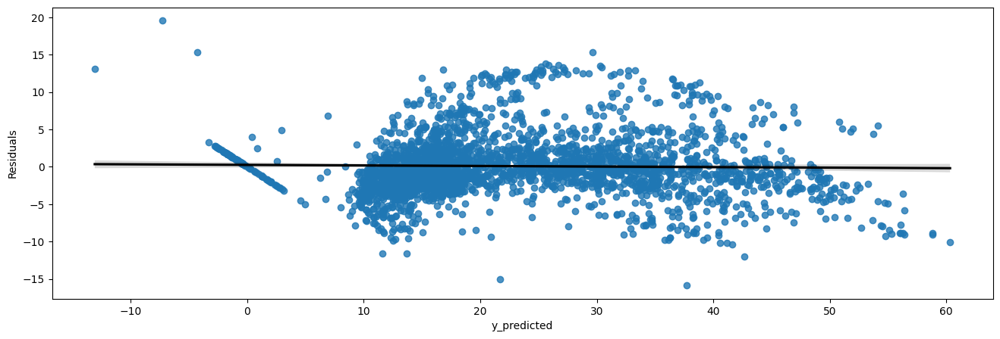

In [292]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

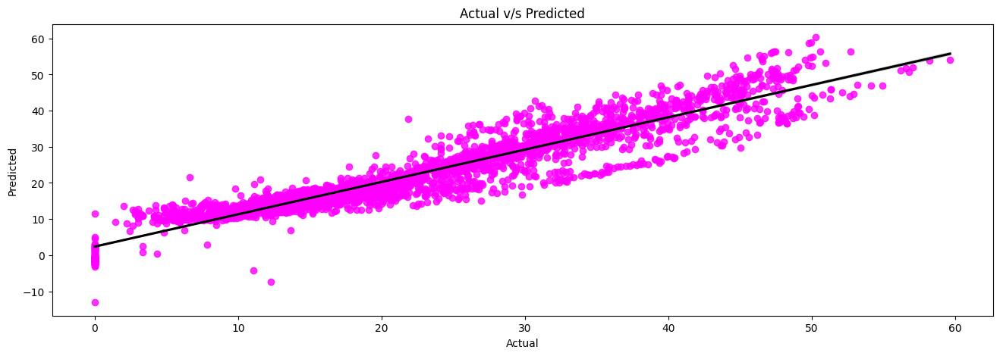

In [293]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

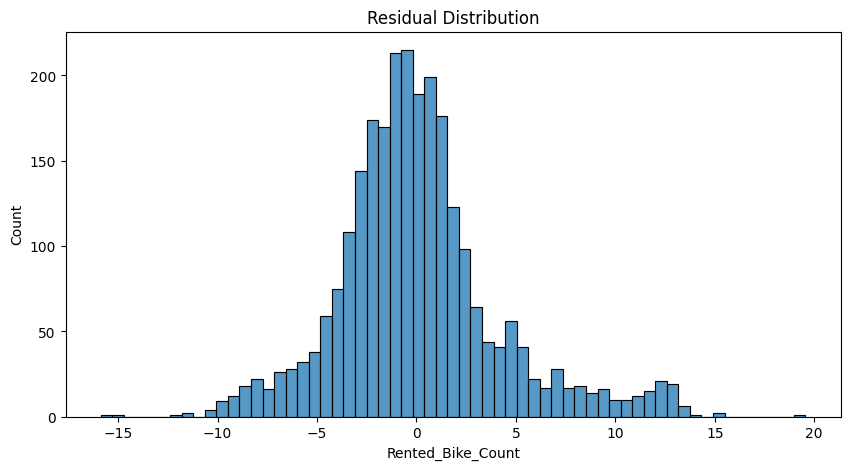

In [294]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)

Residual_histPlot(y_pred,y_test)

In [295]:
save_model(lasso_reg,"Lasso_Regression_model.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Lasso_Regression_model.pkl


# Ridge

In [296]:
# instantiating
ridge_lg=Ridge(alpha=0.1)
# fitting and training
ridge_lg.fit(X_train,y_train)

Ridge(alpha=0.1)

In [297]:
# check coefficient
ridge_lg.coef_

array([  1.78587946,   2.38985741,  -0.10902751,   5.97834481,
       -18.60037033,  -4.91618457,  -1.13444822,  14.70843464,
         1.06909555,  -0.37742331,  46.53528544,  -0.58253877,
        -0.73583462,  -1.60012269])

In [298]:
# get dataframe for x columns and coeff
pd.DataFrame(ridge_lg.coef_,X.columns,columns=['Coefficients'])

,Coefficients
Hour,1.785879
Temperature,2.389857
Wind_speed,-0.109028
Solar_Radiation,5.978345
Rainfall,-18.600370
Snowfall,-4.916185
Holiday,-1.134448
Functioning_Day,14.708435
Month,1.069096
Weekdays_or_weekend,-0.377423


In [299]:
# Check intercept
ridge_lg.intercept_

-4.494570757722183

In [300]:
# y predictions on training dataset
y_pred_train_ridge=ridge_lg.predict(X_train)
# y predictions on test dataset
y_pred_ridge=ridge_lg.predict(X_test)

### Evaluation On Train Data.

In [301]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 2.933957390643899.
The Mean Squred Error(MSE) is 16.20101861332956.
The Root Mean Squared Error(RMSE) is 4.025048895768791.
The R2 Score is 0.8960493009911566.


In [302]:
train_dict={'Model':"Ridge",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}



In [303]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df



,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960


### Evaluation On Test Data.

In [304]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 2.9658483595905625.
 The Mean Squred Error(MSE) is 17.052415553193633.
The Root Mean Squared Error(RMSE) is 4.129457053075336.
The R2 Score is 0.8886095556220155.


In [305]:
test_dict={'Model':"Ridge",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [306]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886


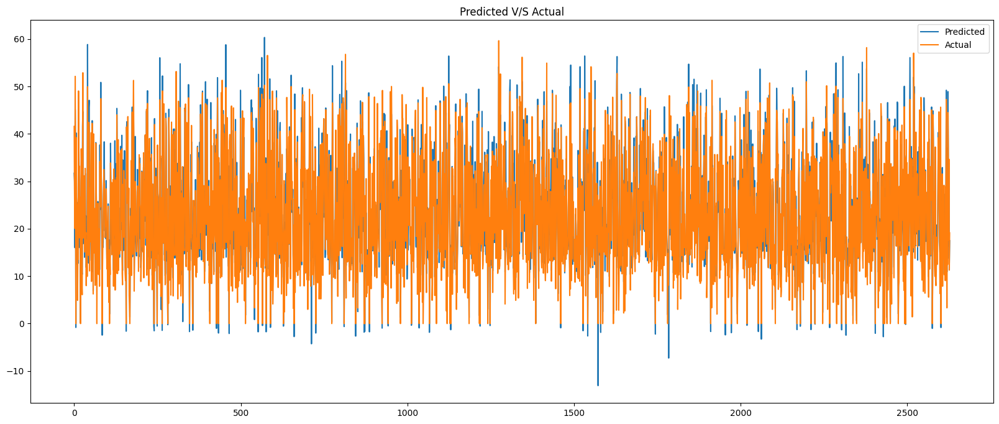

In [307]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

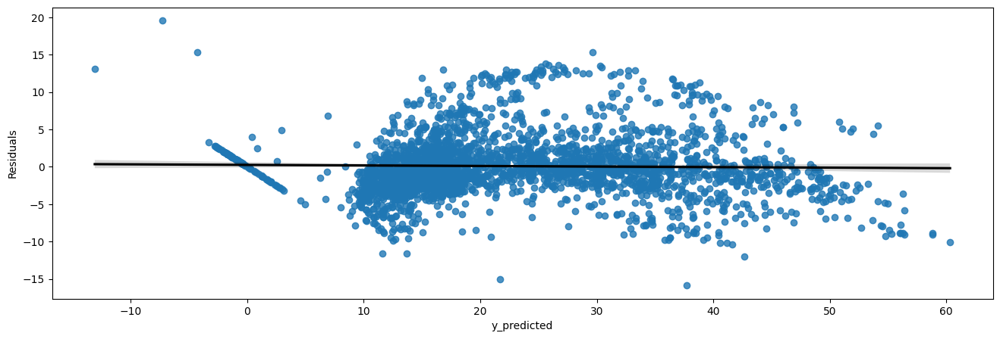

In [308]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

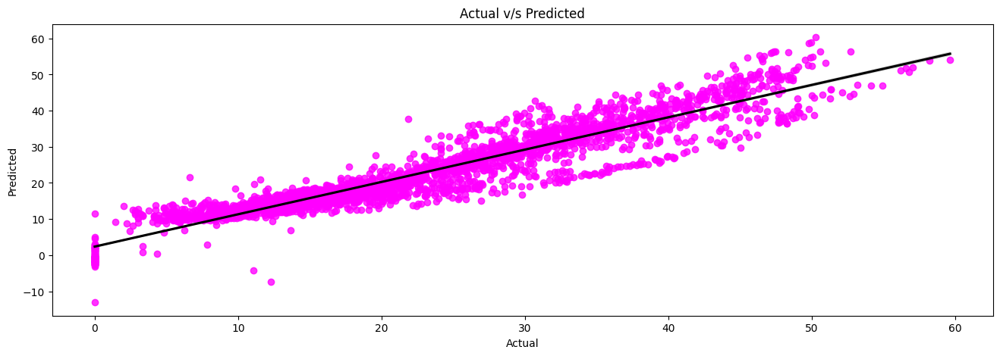

In [309]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

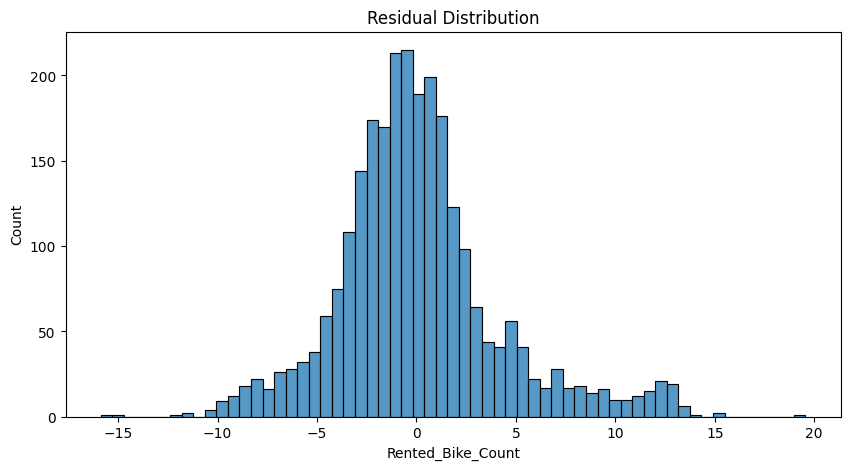

In [310]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

* Here, α (alpha) is the parameter which balances the amount of emphasis given to minimizing RSS vs minimizing sum of square of coefficients. α can take various values:

* α = 0:
The objective becomes same as simple linear regression.
We’ll get the same coefficients as simple linear regression.
* α = ∞:
The coefficients will be zero. Why? Because of infinite weightage on square of coefficients, anything less than zero will make the objective infinite.
* 0 < α < ∞:
The magnitude of α will decide the weightage given to different parts of objective.
The coefficients will be somewhere between 0 and ones for simple linear regression.

In [311]:
save_model(ridge_lg,"Ridge_Linear_Regression.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Ridge_Linear_Regression.pkl


# ElasticNet

In [312]:
# creating object of elastic net
elastic_net_reg=ElasticNet(alpha=0.001,l1_ratio=0.5)
elastic_net_reg.fit(X_train,y_train)

ElasticNet(alpha=0.001)

In [313]:
# Check score on train data
elastic_net_reg.score(X_train,y_train)

0.8964906394093045

In [314]:
# check score on test data
elastic_net_reg.score(X_test,y_test)

0.8886120952987344

In [315]:
# predicting Y train values from train data set
y_pred_train=elastic_net_reg.predict(X_train)
# predicting y values from test data
y_pred=elastic_net_reg.predict(X_test)

In [316]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 2.9134856467216674.
The Mean Squred Error(MSE) is 16.132234737940863.
The Root Mean Squared Error(RMSE) is 4.01649533025259.
The R2 Score is 0.8964906394093045.


In [317]:
train_dict={'Model':"ElasticNet",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [318]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960
3,ElasticNet,2.9135,16.1322,4.0165,0.8965


In [319]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 2.952945652810102.
 The Mean Squred Error(MSE) is 17.05202676200941.
The Root Mean Squared Error(RMSE) is 4.129409977467654.
The R2 Score is 0.8886120952987344.


In [320]:
test_dict={'Model':"ElasticNet",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [321]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886
3,ElasticNet,2.9529,17.0520,4.1294,0.8886


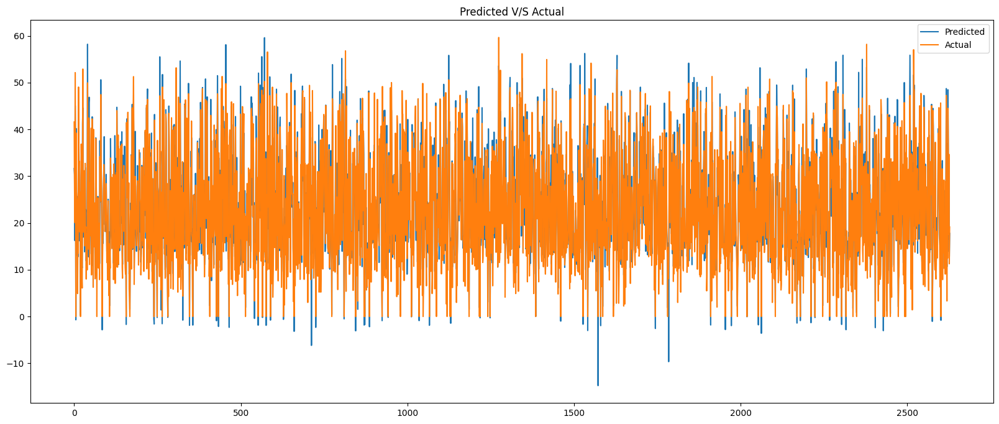

In [322]:
# plotting predicted v/s actual
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

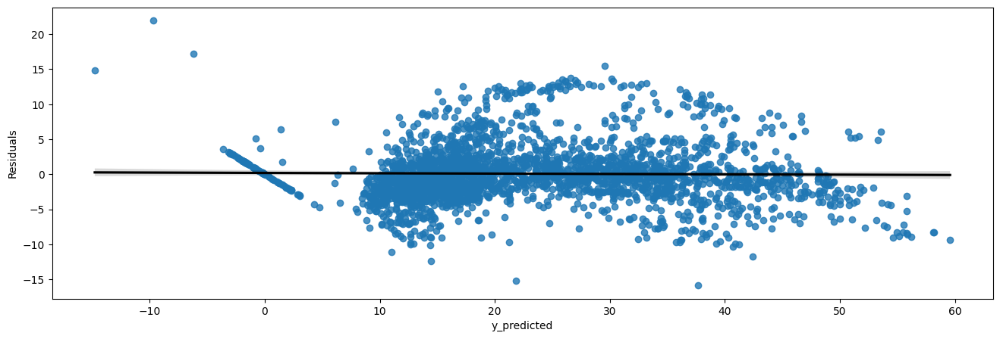

In [323]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

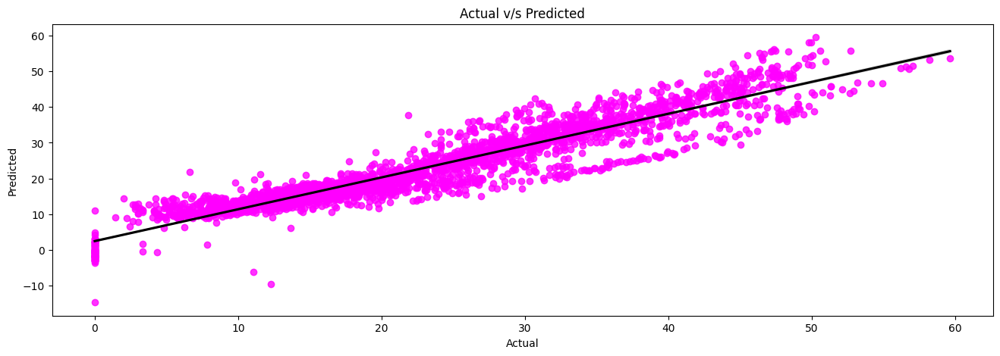

In [324]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

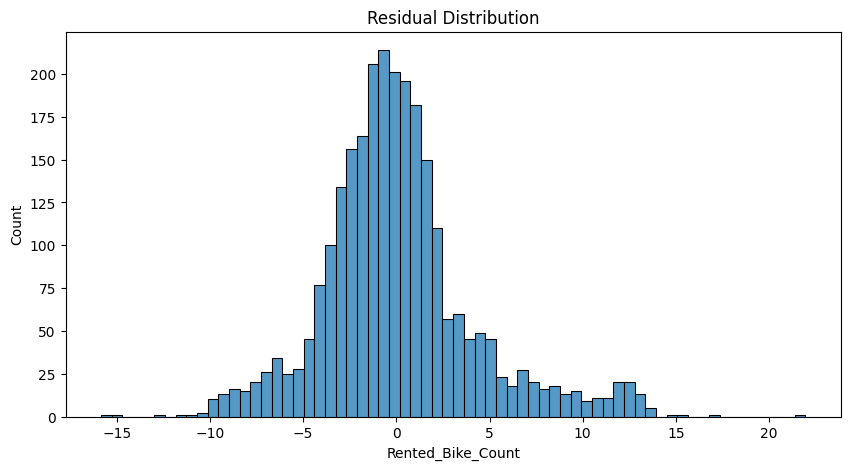

In [325]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

In [326]:
print(traing_results_df)
print()
print(test_results_df)

               Model     MAE      MSE    RMSE  R2_score
0  Linear Regression  2.9141  16.0866  4.0108    0.8968
1              Lasoo  2.9340  16.2010  4.0250    0.8960
2              Ridge  2.9340  16.2010  4.0250    0.8960
3         ElasticNet  2.9135  16.1322  4.0165    0.8965

               Model     MAE      MSE    RMSE  R2_score
0  Linear Regression  2.9666  17.2710  4.1558    0.8872
1              Lasso  2.9658  17.0524  4.1295    0.8886
2              Ridge  2.9658  17.0524  4.1295    0.8886
3         ElasticNet  2.9529  17.0520  4.1294    0.8886


In [327]:
save_model(elastic_net_reg,"Linear_Regression_Elastic_net.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Linear_Regression_Elastic_net.pkl


As We have saw in linear regression,lasso,ridge and elastic net we are getting almost similar R2 scores.

# *Decision Tree Regressor*

In [328]:
# Import decision tree packages
from sklearn.tree import DecisionTreeRegressor

# Create an object
D_tree = DecisionTreeRegressor(max_depth=15, splitter='best', max_features=None)  

# Fitting the model to the training data
D_tree.fit(X_train, y_train)


DecisionTreeRegressor(max_depth=15)

In [329]:
# Check score on Train dataset
D_tree.score(X_train,y_train)

0.9985973896306338

In [330]:
# check score on Test dataset.
D_tree.score(X_test,y_test)

0.9639428322184541

In [331]:
#  predicting y_train_predictions from  X train values
y_pred_train=D_tree.predict(X_train)
#  predicting y_predictions from  X test values
y_pred=D_tree.predict(X_test)

In [332]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


The Mean Absolute Error (MAE) is 0.2044441071780205.
The Mean Squred Error(MSE) is 0.2186009032937526.
The Root Mean Squared Error(RMSE) is 0.4675477550943353.
The R2 Score is 0.9985973896306338.


In [333]:
# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [334]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960
3,ElasticNet,2.9135,16.1322,4.0165,0.8965
4,Decision Tree Regressor,0.2044,0.2186,0.4675,0.9986


In [335]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 1.3963803355838722.
 The Mean Squred Error(MSE) is 5.5198793048685335.
The Root Mean Squared Error(RMSE) is 2.349442339124017.
The R2 Score is 0.9639428322184541.


In [336]:

test_dict={'Model':"Decision Tree Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [337]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886
3,ElasticNet,2.9529,17.0520,4.1294,0.8886
4,Decision Tree Regressor,1.3964,5.5199,2.3494,0.9639


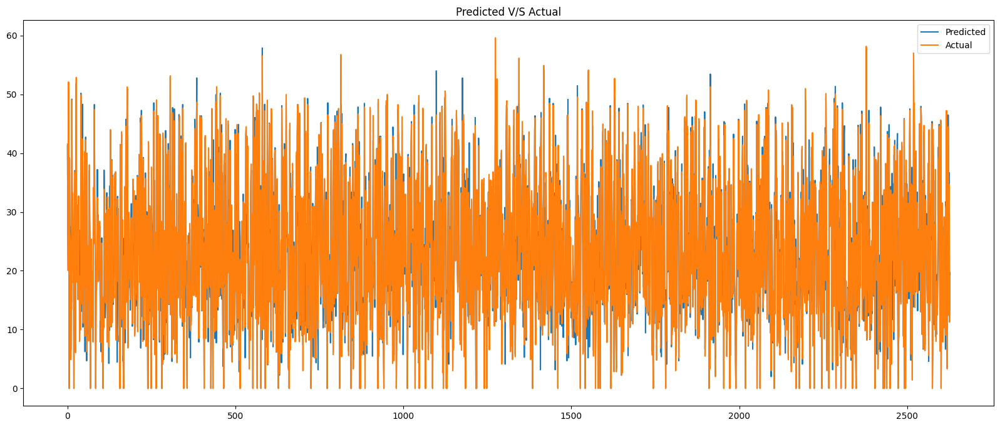

In [338]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

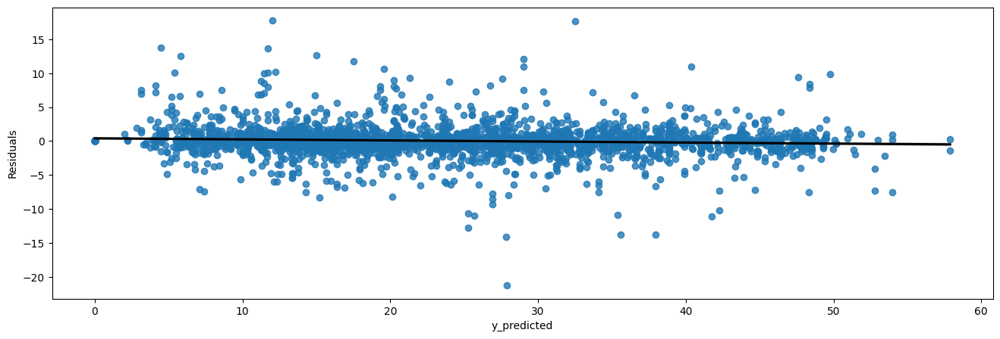

In [339]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

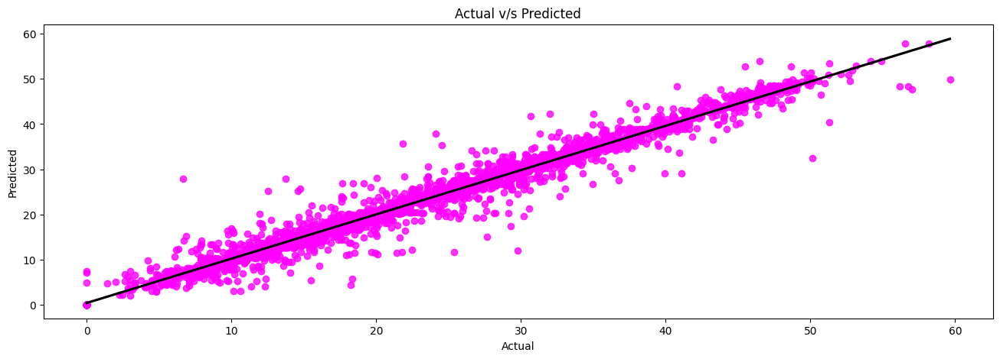

In [340]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

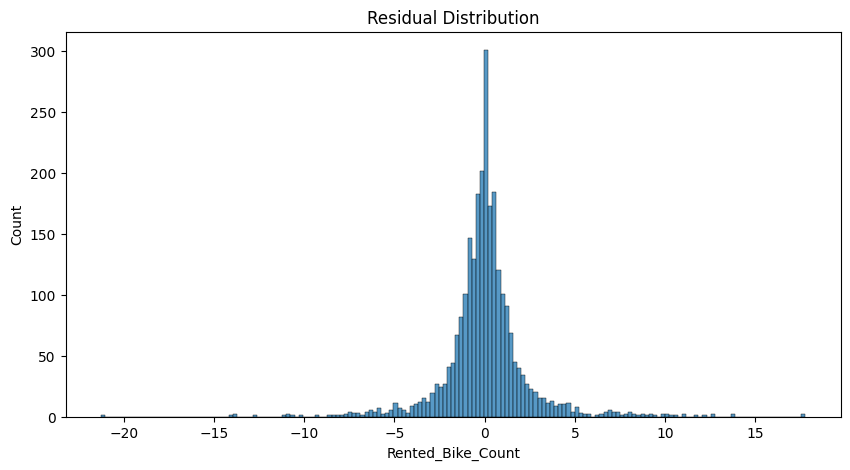

In [341]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)
Residual_histPlot(y_pred,y_test)

In [342]:
save_model(D_tree,"Decision_Tree_Regressor_model.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Decision_Tree_Regressor_model.pkl


# Hyperparameter Tuning

In [343]:
from sklearn.model_selection import GridSearchCV

In [344]:
# Hyper parameters range intialization for tuning 
tree=DecisionTreeRegressor()
parameters={'criterion': ["absolute_error"],
            "splitter":["best","random"],
            "max_depth" : [3,5,7,9],
           "max_features":["auto","log2"] }

In [345]:
tuning_model=GridSearchCV(tree,param_grid=parameters,scoring='neg_mean_squared_error',cv=5) 
tuning_model.fit(X_train,y_train)

/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/opt/anaconda3/envs/machineLearning/lib/python3.12/site-packages/sklearn/base.py", line 666, in _validate_params

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['absolute_error'],
                         'max_depth': [3, 5, 7, 9],
                         'max_features': ['auto', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error')

In [346]:
tuning_model.best_params_

{'criterion': 'absolute_error',
 'max_depth': 5,
 'max_features': 'log2',
 'splitter': 'best'}

In [347]:
D_tree=DecisionTreeRegressor(criterion='absolute_error',max_depth=9,max_features='log2',splitter='best')
D_tree.fit(X_train,y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=9,
                      max_features='log2')

In [348]:
#  predicting y_train_predictions from  X train values
y_pred_train=D_tree.predict(X_train)
#  predicting y_predictions from  X test values
y_pred=D_tree.predict(X_test)

In [349]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

# creating dictionary  of Decison tree results( Train dataset)
train_dict={'Model':"Decision Tree Best Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df


The Mean Absolute Error (MAE) is 2.7934682205182457.
The Mean Squred Error(MSE) is 18.886529539764272.
The Root Mean Squared Error(RMSE) is 4.345863497599098.
The R2 Score is 0.8788182401139664.


,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960
3,ElasticNet,2.9135,16.1322,4.0165,0.8965
4,Decision Tree Regressor,0.2044,0.2186,0.4675,0.9986
5,Decision Tree Best Regressor,2.7935,18.8865,4.3459,0.8788


In [350]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")


test_dict={'Model':"Decision Tree Best Regressor",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df


 The Mean Absolute Error (MAE) is 3.1154416315986673.
 The Mean Squred Error(MSE) is 21.844262834098856.
The Root Mean Squared Error(RMSE) is 4.673784637111433.
The R2 Score is 0.8573080666132338.


,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886
3,ElasticNet,2.9529,17.0520,4.1294,0.8886
4,Decision Tree Regressor,1.3964,5.5199,2.3494,0.9639
5,Decision Tree Best Regressor,3.1154,21.8443,4.6738,0.8573


Text(0.5, 0, 'Relative Importance')

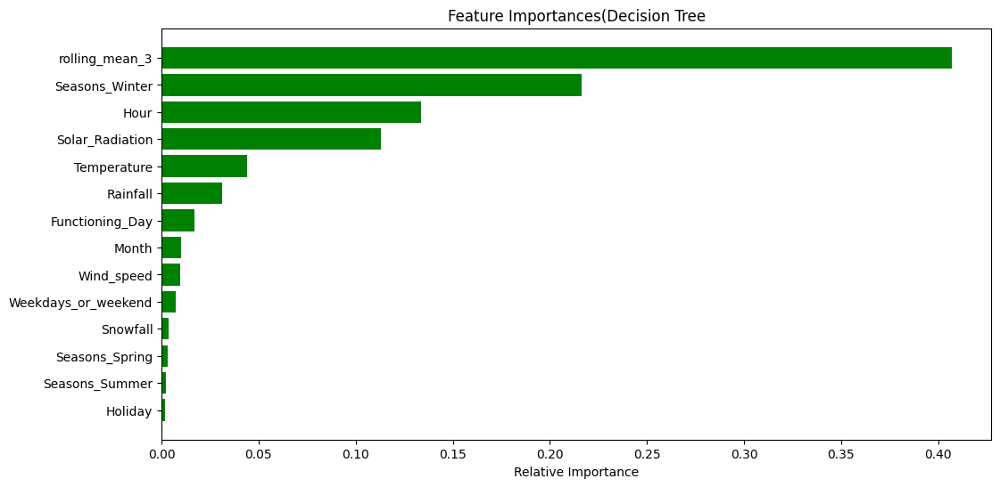

In [351]:
imp_variables=X.columns
importances = D_tree.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12,6))
plt.title('Feature Importances(Decision Tree')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), imp_variables[indices])
plt.xlabel('Relative Importance')

We have applied this best parameters to above Decsion tree regressor model

In [352]:
save_model(tuning_model,"Decision_Tree_Best_Regressor_model.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Decision_Tree_Best_Regressor_model.pkl


### Random Forest Regressor

In [353]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(X_train,y_train)

RandomForestRegressor()

In [354]:
rf.score(X_train,y_train)

0.9968995894136287

In [355]:
rf.score(X_test,y_test)

0.9815895195498081

In [356]:
y_pred_train=rf.predict(X_train)
y_pred=rf.predict(X_test)

In [357]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 0.3991461344856268.
The Mean Squred Error(MSE) is 0.4832080024252032.
The Root Mean Squared Error(RMSE) is 0.6951316439532897.
The R2 Score is 0.9968995894136287.


In [358]:
train_dict={'Model':"Random Forest",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [359]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960
3,ElasticNet,2.9135,16.1322,4.0165,0.8965
4,Decision Tree Regressor,0.2044,0.2186,0.4675,0.9986
5,Decision Tree Best Regressor,2.7935,18.8865,4.3459,0.8788
6,Random Forest,0.3991,0.4832,0.6951,0.9969


In [360]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 1.0344846676667696.
 The Mean Squred Error(MSE) is 2.8184030050666298.
The Root Mean Squared Error(RMSE) is 1.6788099967139312.
The R2 Score is 0.9815895195498081.


In [361]:
test_dict={'Model':"Radom forest",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}

In [362]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886
3,ElasticNet,2.9529,17.0520,4.1294,0.8886
4,Decision Tree Regressor,1.3964,5.5199,2.3494,0.9639
5,Decision Tree Best Regressor,3.1154,21.8443,4.6738,0.8573
6,Radom forest,1.0345,2.8184,1.6788,0.9816


In [363]:
save_model(rf,"Random_Forest_Regressor_model.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Random_Forest_Regressor_model.pkl


### Hyper Parameter On random Forest

In [364]:
param={'n_estimators':[25,50,40,80,100],'max_depth':[3,4,5,6,7,8,9]}

In [365]:
rf_reg=RandomForestRegressor()
rf_tuning=GridSearchCV(rf_reg,param_grid=param,scoring='neg_mean_squared_error',cv=5)
rf_tuning.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9],
                         'n_estimators': [25, 50, 40, 80, 100]},
             scoring='neg_mean_squared_error')

In [366]:
rf_tuning.best_params_

{'max_depth': 9, 'n_estimators': 80}

In [367]:
rf=RandomForestRegressor(max_depth=9,n_estimators=100)
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=9)

In [368]:

rf.score(X_train,y_train)

0.9864587798070525

In [369]:

rf.score(X_test,y_test)

0.9779025323262304

In [370]:
y_pred_train=rf.predict(X_train)
y_pred=rf.predict(X_test)

In [371]:
# Evaluation of training data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_train,y_pred_train)
print(f"The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_train,y_pred_train)
print(f"The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_train,y_pred_train)
print(f"The R2 Score is {R2}.")

The Mean Absolute Error (MAE) is 0.9561254513877315.
The Mean Squred Error(MSE) is 2.1104385298503177.
The Root Mean Squared Error(RMSE) is 1.4527348449907567.
The R2 Score is 0.9864587798070525.


In [372]:
train_dict={'Model':"Random Forest-GridSearchCv",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}



In [373]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([train_dict])

# Concatenate the new rows to the existing DataFrame
traing_results_df = pd.concat([traing_results_df, new_row_df], ignore_index=True)
traing_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9141,16.0866,4.0108,0.8968
1,Lasoo,2.9340,16.2010,4.0250,0.8960
2,Ridge,2.9340,16.2010,4.0250,0.8960
3,ElasticNet,2.9135,16.1322,4.0165,0.8965
4,Decision Tree Regressor,0.2044,0.2186,0.4675,0.9986
5,Decision Tree Best Regressor,2.7935,18.8865,4.3459,0.8788
6,Random Forest,0.3991,0.4832,0.6951,0.9969
7,Random Forest-GridSearchCv,0.9561,2.1104,1.4527,0.9865


In [374]:
# Evaluation of Test data set

#Calculate Mean Absolute Error.
MAE= mean_absolute_error(y_test,y_pred)
print(f" The Mean Absolute Error (MAE) is {MAE}.")

#Calculate  Mean Squared Error
MSE=mean_squared_error(y_test,y_pred)
print(f" The Mean Squred Error(MSE) is {MSE}.")

#Calculate Root Mean Squared Error
RMSE=np.sqrt(MSE)
print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

#Calculate R2 Score
R2=r2_score(y_test,y_pred)
print(f"The R2 Score is {R2}.")

 The Mean Absolute Error (MAE) is 1.1877540499586494.
 The Mean Squred Error(MSE) is 3.382832374451473.
The Root Mean Squared Error(RMSE) is 1.8392477740781619.
The R2 Score is 0.9779025323262304.


In [375]:
test_dict={'Model':"Random Forest-GridSearchCv",
             'MAE':round(MAE,4),
             'MSE':round(MSE,4),
             'RMSE':round(RMSE,4),
             'R2_score':round(R2,4)}


In [376]:
# appending train result to training result dataframe
new_row_df = pd.DataFrame([test_dict])

# Concatenate the new rows to the existing DataFrame
test_results_df = pd.concat([test_results_df, new_row_df], ignore_index=True)
test_results_df

,Model,MAE,MSE,RMSE,R2_score
0,Linear Regression,2.9666,17.2710,4.1558,0.8872
1,Lasso,2.9658,17.0524,4.1295,0.8886
2,Ridge,2.9658,17.0524,4.1295,0.8886
3,ElasticNet,2.9529,17.0520,4.1294,0.8886
4,Decision Tree Regressor,1.3964,5.5199,2.3494,0.9639
5,Decision Tree Best Regressor,3.1154,21.8443,4.6738,0.8573
6,Radom forest,1.0345,2.8184,1.6788,0.9816
7,Random Forest-GridSearchCv,1.1878,3.3828,1.8392,0.9779


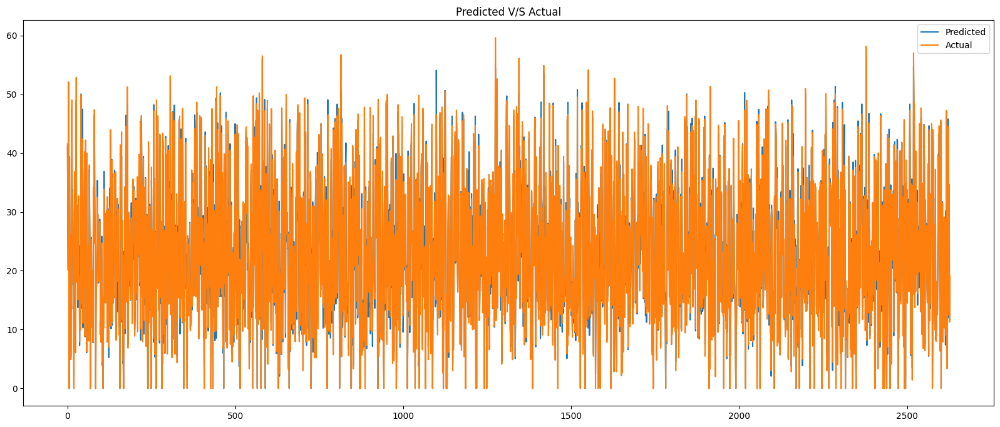

In [377]:
plot_Pred_vs_actual(y_pred,y_test)

Text(0.5, 0, 'y_predicted')

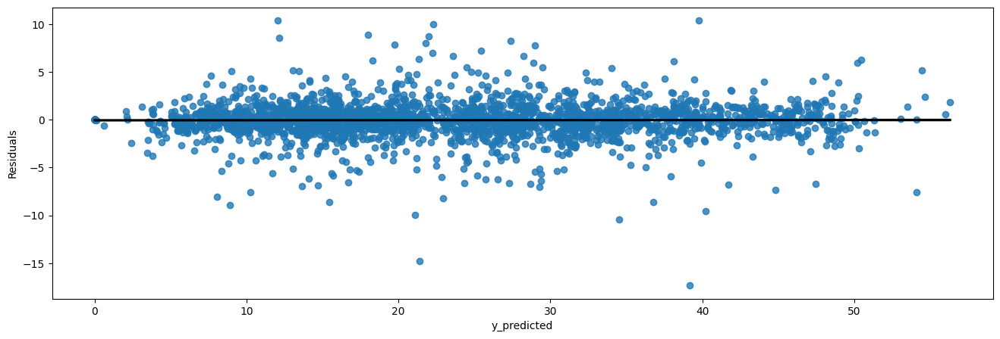

In [378]:
# Check Homoscedasticity by plotting y_predicted values and the residuals
plt.figure(figsize=(16,5))
sns.regplot(x=y_pred,y=y_test-y_pred,line_kws={'color':'black'})
plt.ylabel('Residuals')
plt.xlabel('y_predicted')

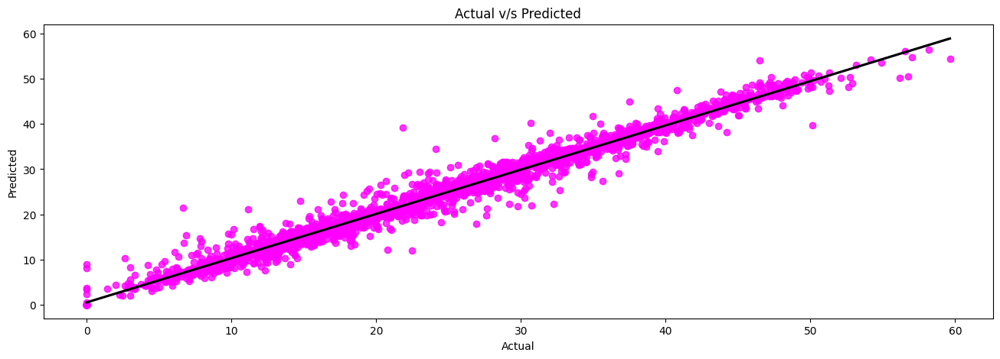

In [379]:
# Checking how predicted values and actual values are close  to the regression line
plot_scatter(y_pred,y_test)

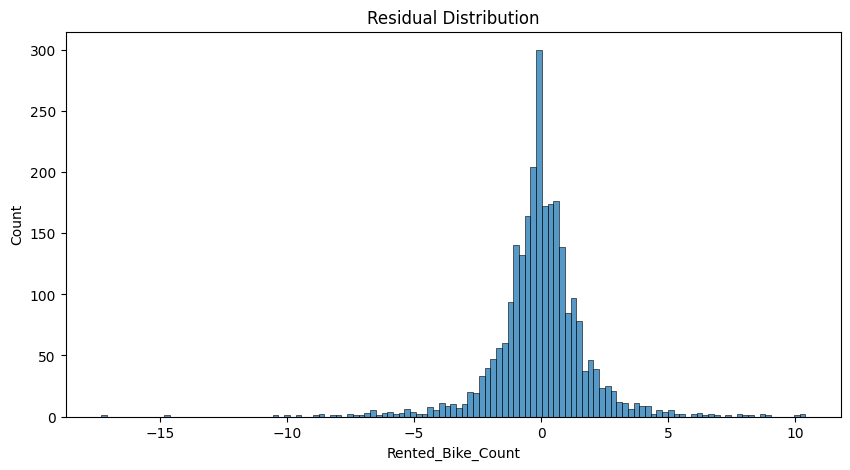

In [380]:
# Residuals of the regression are normally distributed.(Homoscedasticity refers to whether these residuals are equally distributed)

Residual_histPlot(y_pred,y_test)

Text(0.5, 0, 'Relative Importance')

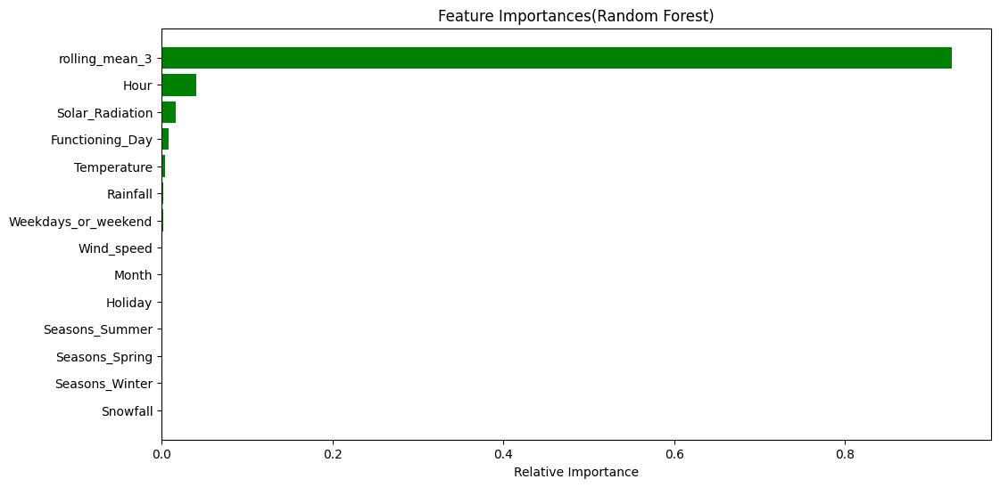

In [381]:
imp_variables=X.columns
importances = rf.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12,6))
plt.title('Feature Importances(Random Forest)')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), imp_variables[indices])
plt.xlabel('Relative Importance')

In [382]:
save_model(rf_tuning,"Random_Forest_GridSearchCV.pkl")

Model saved to /Users/mayankkumar/Downloads/ML_PROJECT_CODE/save_model/Random_Forest_GridSearchCV.pkl


### By looking at the graph we can say that temperature and hours plays very important role on bike rentals.

#### Conclusions:

* #### As we have calculated MAE,MSE,RMSE and R2 score for each model. Based on r2 score will decide our model performance.
* #### Our assumption: if the differnece of R2 score between Train data and Test is more than 5 % we will consider it as overfitting. 

# Linear,Lasso,Ridge and ElasticNet.

>* #### 1)From The above data frame, we can see that linear,Lasso,Ridge  and Elastic  regression models have almost similar R2 scores(61%) on both training and test data.
 
# Decision Tree Regressor:
> * #### On Decision tree regressor model, without hyperparameter tuning we got R2 score as 98.6% on training data and on test data it was very less 86% . Thus our model memorised the data.So it was a overfitted model.
* #### After hyperparameter tuning we got R2 score as 76% on training data and 74% on test data which is quite good for us.

# Random Forest:

> * #### On Random Forest regressor model, without hyperparameter tuning we got r2 score as 98% on training data and 90% on test data. Thus our model memorised the data.So it was a overfitted model, as per our assumption
* #### After hyperparameter tuning we got R2 score as 91% on training data and 88% on test data which is  very good for us.

> * ## Random forest(gridSearchCv) gives good r2 scores. We can deploy this model.

### In terms of features, Temperature and Hours plays very important role in 3 models. Other features importances are different in 3 models.